# Drive Test Cleaning + Focused EDA Notebook

This notebook continues the first exploration phase and turns it into a **cleaning-aware EDA pipeline**.

The raw drive-test file has **64,949 rows × 1,365 columns**. The previous profile showed very high missingness, so this notebook uses a controlled cleaning strategy instead of blindly deleting columns.

## Main cleaning decision

We will use a **70% missing-value threshold** with protected telecom columns.

That means:

- remove columns that are completely empty;
- remove columns with more than 70% missing values;
- remove constant columns that do not add analytical value;
- protect important columns such as ID, timestamp, location, events, and activity start/end timestamps;
- avoid global numeric imputation during EDA because missing values in drive-test exports are often meaningful.

## Expected folder structure

Run this notebook from your project folder:

```text
Graduation Project/
├── Raw_Data/
│   ├── Network_Drive_Test.pkl
│   └── NR5G_PCI_RSI_Planning.xlsx
├── Drive_Test_Cleaning_EDA.ipynb
└── Cleaned_EDA_Outputs/      # created automatically by this notebook
```

The output folder will contain cleaning reports, cleaned dictionaries, event tables, activity tables, session summaries, and planning-comparison outputs.

## What this notebook produces

The notebook exports useful tables to `Cleaned_EDA_Outputs`, including:

| Output | Purpose |
|---|---|
| `raw_data_dictionary.csv` | Full profile before cleaning |
| `missing_threshold_impact.csv` | How many columns would remain at different missing thresholds |
| `column_family_summary_before_cleaning.csv` | Missingness by LTE/WCDMA/NR5G/Event/Location/etc. |
| `removed_columns_report.csv` | Every removed column and the reason it was removed |
| `kept_columns_after_cleaning.csv` | Final columns kept after cleaning |
| `cleaned_data_dictionary.csv` | Profile after cleaning |
| `cleaning_summary.csv` | Before/after shape and cleaning counts |
| `events_long.csv` | Event-level table after splitting `$$$$` multi-event fields |
| `activity_table.csv` | Activity-level records from Activity fields |
| `session_summary.csv` | Summary per drive-test ID/session |
| `technology_availability_summary.csv` | LTE/WCDMA/NR5G/event/location availability |
| `planning_data_dictionary.csv` | Planning file profile |
| `planning_mod4_check.csv` | PCI `% 4` validation |
| `drive_nearest_planning_sample.csv` | Nearest planned sector/site per sampled drive point |

The notebook can also export the cleaned base dataset as Parquet or compressed CSV.

In [1]:
# =========================
# 1. Imports and settings
# =========================

from pathlib import Path
import os
import re
import math
import warnings
from typing import Dict, List, Optional, Tuple, Any

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display, HTML

warnings.filterwarnings("ignore")

# Wide display is important because drive-test exports usually have many columns.
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 150)
pd.set_option("display.max_colwidth", 140)
pd.set_option("display.width", 260)

# Use plain matplotlib only.
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["axes.grid"] = True

print("Libraries loaded successfully.")
print("Pandas version:", pd.__version__)

Libraries loaded successfully.
Pandas version: 2.3.3


In [2]:
# =========================
# 2. Project configuration
# =========================

DATA_DIR = Path("Raw_Data")
OUTPUT_DIR = Path("Cleaned_EDA_Outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

# Main raw files.
# If your pickle has no extension, change this to: DATA_DIR / "Network_Drive_Test"
DRIVE_TEST_PATH = DATA_DIR / "Network_Drive_Test.pkl"
PLANNING_XLSX = DATA_DIR / "NR5G_PCI_RSI_Planning.xlsx"

# Cleaning decision.
MISSING_THRESHOLD = 70.0

# Sampling values keep plots and geographic matching fast.
EDA_SAMPLE_ROWS = 50_000
MAP_SAMPLE_ROWS = 10_000
NEAREST_PLANNING_SAMPLE_ROWS = 20_000
RANDOM_SEED = 42

# Exporting the cleaned full dataset can create a large file, but it is useful.
EXPORT_CLEANED_FULL_DATA = True

# Planning comparison settings.
DEFAULT_PLANNING_RADIUS_KM = 7.0
EARTH_RADIUS_KM = 6371.0088

print("Data folder:", DATA_DIR.resolve())
print("Output folder:", OUTPUT_DIR.resolve())
print("Drive-test file:", DRIVE_TEST_PATH)
print("Planning file:", PLANNING_XLSX)
print("Missing threshold:", MISSING_THRESHOLD, "%")

Data folder: D:\ITI 9 Months\Graduation Project\Raw_Data
Output folder: D:\ITI 9 Months\Graduation Project\Cleaned_EDA_Outputs
Drive-test file: Raw_Data\Network_Drive_Test.pkl
Planning file: Raw_Data\NR5G_PCI_RSI_Planning.xlsx
Missing threshold: 70.0 %


# 1. Helper functions

The functions below keep the rest of the notebook clean. They handle saving outputs, profiling columns, detecting column families, plotting, timestamp parsing, ID parsing, and distance calculations.

In [3]:
# =========================
# General utility functions
# =========================

def human_bytes(num_bytes: float) -> str:
    """Convert bytes to a readable memory-size string."""
    if pd.isna(num_bytes):
        return "N/A"
    units = ["B", "KB", "MB", "GB", "TB"]
    size = float(num_bytes)
    for unit in units:
        if size < 1024:
            return f"{size:,.2f} {unit}"
        size /= 1024
    return f"{size:,.2f} PB"


def save_table(df: pd.DataFrame, filename: str, index: bool = False) -> Path:
    """Save a DataFrame to the output folder as UTF-8 CSV."""
    path = OUTPUT_DIR / filename
    df.to_csv(path, index=index, encoding="utf-8-sig")
    print("Saved:", path)
    return path


def sample_df(df: pd.DataFrame, n: int, seed: int = RANDOM_SEED) -> pd.DataFrame:
    """Sample safely. If the DataFrame is smaller than n, return a copy of the full DataFrame."""
    if len(df) <= n:
        return df.copy()
    return df.sample(n=n, random_state=seed).copy()


def safe_value_counts(s: pd.Series, top_n: int = 10) -> Dict[str, int]:
    """Return top values as a dictionary without failing on mixed types."""
    if s.dropna().empty:
        return {}
    return s.dropna().astype(str).value_counts().head(top_n).to_dict()


def get_column_family(col: str) -> str:
    """Extract a practical column family such as LTE, WCDMA, NR5G, Location, Events, Activity."""
    col = str(col)
    if " - " in col:
        return col.split(" - ")[0].strip()
    if "." in col:
        return col.split(".")[0].strip()
    return col.split()[0].strip()


def first_existing(df: pd.DataFrame, candidates: List[str]) -> Optional[str]:
    """Return the first candidate column that exists in df."""
    for c in candidates:
        if c in df.columns:
            return c
    return None


def columns_containing(df: pd.DataFrame, patterns: List[str], case: bool = False) -> List[str]:
    """Find columns whose names contain at least one regex pattern."""
    flags = 0 if case else re.IGNORECASE
    matched = []
    for col in df.columns:
        text = str(col)
        if any(re.search(p, text, flags=flags) for p in patterns):
            matched.append(col)
    return matched


def overview(df: pd.DataFrame, name: str) -> None:
    """Display compact DataFrame overview."""
    print(f"===== {name} =====")
    print("Shape:", df.shape)
    print("Rows:", f"{len(df):,}")
    print("Columns:", f"{df.shape[1]:,}")
    print("Memory:", human_bytes(df.memory_usage(deep=True).sum()))
    display(pd.DataFrame({
        "column": df.columns,
        "dtype": df.dtypes.astype(str).values,
        "non_null": df.notna().sum().values,
        "missing": df.isna().sum().values,
        "missing_pct": (df.isna().mean().values * 100).round(3),
    }))

In [4]:
# =========================
# Data dictionary functions
# =========================

def build_data_dictionary(
    df: pd.DataFrame,
    name: str,
    sample_rows: int = 100_000,
    top_n: int = 5,
) -> pd.DataFrame:
    """
    Build a practical data dictionary.

    Missing counts are calculated on the full DataFrame.
    Unique counts, examples, and numeric summaries are calculated on a sample for speed.
    """
    sample = sample_df(df, sample_rows)
    missing_count = df.isna().sum()
    missing_pct = df.isna().mean() * 100
    non_null_count = df.notna().sum()

    records = []
    for col in df.columns:
        s_full = df[col]
        s = sample[col]
        dtype = str(s_full.dtype)
        family = get_column_family(col)
        nunique_sample = s.nunique(dropna=True)
        non_null_sample = s.notna().sum()

        record = {
            "dataset": name,
            "column": col,
            "family": family,
            "dtype": dtype,
            "full_non_null_count": int(non_null_count[col]),
            "full_missing_count": int(missing_count[col]),
            "full_missing_pct": round(float(missing_pct[col]), 3),
            "sample_unique_count": int(nunique_sample),
            "sample_unique_pct": round(float(nunique_sample / max(non_null_sample, 1) * 100), 3),
            "sample_non_null_examples": s.dropna().astype(str).head(top_n).tolist(),
        }

        if pd.api.types.is_numeric_dtype(s_full):
            numeric_s = pd.to_numeric(s, errors="coerce")
            record.update({
                "sample_min": numeric_s.min(),
                "sample_max": numeric_s.max(),
                "sample_mean": numeric_s.mean(),
                "sample_std": numeric_s.std(),
                "sample_top_values": None,
            })
        else:
            record.update({
                "sample_min": None,
                "sample_max": None,
                "sample_mean": None,
                "sample_std": None,
                "sample_top_values": safe_value_counts(s, top_n=top_n),
            })

        records.append(record)

    dictionary = pd.DataFrame(records)
    return dictionary.sort_values(["full_missing_pct", "family", "column"], ascending=[False, True, True]).reset_index(drop=True)


def summarize_column_families(profile: pd.DataFrame) -> pd.DataFrame:
    """Summarize missingness and usefulness by column family."""
    summary = (
        profile.groupby("family")
        .agg(
            columns=("column", "count"),
            avg_missing_pct=("full_missing_pct", "mean"),
            min_missing_pct=("full_missing_pct", "min"),
            max_missing_pct=("full_missing_pct", "max"),
            zero_missing_columns=("full_missing_pct", lambda x: int((x == 0).sum())),
            fully_missing_columns=("full_missing_pct", lambda x: int((x == 100).sum())),
            above_70pct_missing=("full_missing_pct", lambda x: int((x > MISSING_THRESHOLD).sum())),
        )
        .reset_index()
        .sort_values(["columns", "avg_missing_pct"], ascending=[False, False])
    )
    summary["avg_missing_pct"] = summary["avg_missing_pct"].round(3)
    return summary


def threshold_impact(profile: pd.DataFrame, thresholds: List[int] = [50, 60, 70, 75, 80, 90, 95, 99]) -> pd.DataFrame:
    """Show how many columns remain under different missing-value thresholds."""
    rows = []
    total = len(profile)
    for t in thresholds:
        removed = int((profile["full_missing_pct"] > t).sum())
        rows.append({
            "missing_threshold_pct": t,
            "columns_removed_if_not_protected": removed,
            "columns_kept_if_not_protected": total - removed,
            "removed_pct_of_all_columns": round(removed / max(total, 1) * 100, 2),
        })
    return pd.DataFrame(rows)

In [5]:
# =========================
# Plotting functions
# =========================

def plot_missing_top(profile: pd.DataFrame, title: str, top_n: int = 40) -> None:
    """Plot columns with the highest missing percentages."""
    top = profile.sort_values("full_missing_pct", ascending=False).head(top_n).sort_values("full_missing_pct")
    plt.figure(figsize=(12, max(5, 0.35 * len(top))))
    plt.barh(top["column"].astype(str), top["full_missing_pct"])
    plt.xlabel("Missing %")
    plt.title(title)
    plt.tight_layout()
    plt.show()


def plot_family_missing(family_summary: pd.DataFrame) -> None:
    """Plot average missingness by column family."""
    temp = family_summary.sort_values("avg_missing_pct")
    plt.figure(figsize=(12, max(5, 0.35 * len(temp))))
    plt.barh(temp["family"], temp["avg_missing_pct"])
    plt.xlabel("Average missing %")
    plt.title("Average missingness by column family")
    plt.tight_layout()
    plt.show()


def plot_numeric_hist(df: pd.DataFrame, col: str, bins: int = 60) -> None:
    """Plot a histogram for one numeric column."""
    if col not in df.columns:
        print(f"Column not found: {col}")
        return
    values = pd.to_numeric(df[col], errors="coerce").dropna()
    if values.empty:
        print(f"No numeric values for {col}")
        return
    plt.figure(figsize=(12, 4))
    plt.hist(values, bins=bins)
    plt.title(f"Distribution: {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


def plot_top_categories(df: pd.DataFrame, col: str, top_n: int = 20) -> None:
    """Plot the top categories for one column."""
    if col not in df.columns:
        print(f"Column not found: {col}")
        return
    vc = df[col].dropna().astype(str).value_counts().head(top_n).sort_values()
    if vc.empty:
        print(f"No values for {col}")
        return
    plt.figure(figsize=(12, max(4, 0.3 * len(vc))))
    plt.barh(vc.index, vc.values)
    plt.title(f"Top {top_n}: {col}")
    plt.xlabel("Count")
    plt.tight_layout()
    plt.show()

In [6]:
# =========================
# Time, ID, event, and geo functions
# =========================

def parse_timestamp_col(df: pd.DataFrame, col: str, new_col: Optional[str] = None) -> pd.DataFrame:
    """Parse a timestamp column while preserving timezone if present."""
    out = df.copy()
    if col in out.columns:
        out[new_col or col] = pd.to_datetime(out[col], errors="coerce")
    return out


def parse_drive_test_id(id_value: Any) -> Dict[str, Any]:
    """
    Parse IDs like:
    542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533

    Expected pieces:
    - IMSI/device ID before first +
    - session/activity timestamp after first +
    - route/test label after second + and before !
    - log/start timestamp after !
    """
    text = str(id_value) if pd.notna(id_value) else ""
    result = {
        "id_imsi": np.nan,
        "id_session_time_raw": np.nan,
        "id_route_test_label": np.nan,
        "id_log_time_raw": np.nan,
        "id_session_time": pd.NaT,
        "id_log_time": pd.NaT,
        "id_location_label": np.nan,
        "id_test_type": np.nan,
    }
    if not text:
        return result

    # Split into main part and log timestamp.
    main_part, bang, log_part = text.partition("!")
    plus_parts = main_part.split("+")

    if len(plus_parts) >= 1:
        result["id_imsi"] = plus_parts[0]
    if len(plus_parts) >= 2:
        result["id_session_time_raw"] = plus_parts[1]
        result["id_session_time"] = pd.to_datetime(plus_parts[1], format="%Y%m%d%H%M%S", errors="coerce")
    if len(plus_parts) >= 3:
        label = "+".join(plus_parts[2:])
        result["id_route_test_label"] = label
        label_parts = label.split("-")
        # For labels like Fiji-Nadi-MO-D, location can be Fiji-Nadi and test type can be MO-D.
        if len(label_parts) >= 2:
            result["id_location_label"] = "-".join(label_parts[:2])
        if len(label_parts) >= 4:
            result["id_test_type"] = "-".join(label_parts[-2:])
        elif len(label_parts) >= 1:
            result["id_test_type"] = label_parts[-1]
    if bang:
        result["id_log_time_raw"] = log_part
        result["id_log_time"] = pd.to_datetime(log_part, format="%Y%m%d%H%M%S", errors="coerce")

    return result


def add_id_features(df: pd.DataFrame, id_col: str = "id") -> pd.DataFrame:
    """Add parsed ID fields to the DataFrame."""
    if id_col not in df.columns:
        print("ID column not found. Skipping ID parsing.")
        return df.copy()
    parsed = df[id_col].drop_duplicates().apply(parse_drive_test_id).apply(pd.Series)
    parsed[id_col] = df[id_col].drop_duplicates().values
    out = df.merge(parsed, on=id_col, how="left")
    return out


def split_multi_value(value: Any, sep: str = "$$$$") -> List[Any]:
    """Split event fields that contain multiple values separated by $$$$."""
    if pd.isna(value):
        return []
    return str(value).split(sep)


def build_events_long(df: pd.DataFrame, id_col: str = "id", sample_time_col: str = "timestamp") -> pd.DataFrame:
    """
    Convert row-level event columns into an event-level table.

    Many drive-test tools store multiple events in one row separated by $$$$.
    This function expands them into one row per event.
    """
    event_cols = [
        "Events.Timestamp",
        "Events.category",
        "Events.Tech",
        "Events.titles",
        "Events.description",
        "Events.subject",
    ]
    available = [c for c in event_cols if c in df.columns]
    if not available:
        print("No Events.* columns found.")
        return pd.DataFrame()

    event_rows = []
    event_source = df[df[available].notna().any(axis=1)].copy()

    for idx, row in event_source.iterrows():
        split_values = {c: split_multi_value(row[c]) for c in available}
        max_len = max([len(v) for v in split_values.values()] + [0])
        for i in range(max_len):
            rec = {
                "source_index": idx,
                "event_order_in_sample": i,
            }
            if id_col in df.columns:
                rec[id_col] = row[id_col]
            if sample_time_col in df.columns:
                rec["sample_timestamp"] = row[sample_time_col]
            for c in available:
                values = split_values[c]
                rec[c] = values[i] if i < len(values) else np.nan
            event_rows.append(rec)

    events = pd.DataFrame(event_rows)
    if "Events.Timestamp" in events.columns:
        events["event_timestamp"] = pd.to_datetime(events["Events.Timestamp"], errors="coerce")
    if "sample_timestamp" in events.columns:
        events["sample_timestamp"] = pd.to_datetime(events["sample_timestamp"], errors="coerce")
        if "event_timestamp" in events.columns:
            events["event_delay_from_sample_seconds"] = (events["event_timestamp"] - events["sample_timestamp"]).dt.total_seconds()
    return events


def haversine_km(lat1, lon1, lat2, lon2):
    """Vectorized haversine distance in kilometers."""
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    return EARTH_RADIUS_KM * 2 * np.arcsin(np.sqrt(a))


def bearing_degrees(lat1, lon1, lat2, lon2):
    """Bearing from point 1 to point 2 in degrees."""
    lat1 = np.radians(lat1)
    lat2 = np.radians(lat2)
    dlon = np.radians(lon2 - lon1)
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    return (np.degrees(np.arctan2(x, y)) + 360) % 360


def angular_difference_deg(a, b):
    """Smallest angular difference in degrees."""
    return np.abs((a - b + 180) % 360 - 180)

# 2. Load the raw drive-test data

The notebook now uses the folder structure directly:

```python
Raw_Data/Network_Drive_Test.pkl
```

If your file has no `.pkl` extension, change `DRIVE_TEST_PATH` in the configuration cell.

In [7]:
# Load the drive-test pickle.
# Pickle files should only be loaded when they come from a trusted source.
if not DRIVE_TEST_PATH.exists():
    raise FileNotFoundError(f"Drive-test pickle not found: {DRIVE_TEST_PATH}. Update DRIVE_TEST_PATH in the configuration cell.")

drive_raw = pd.read_pickle(DRIVE_TEST_PATH)

if not isinstance(drive_raw, pd.DataFrame):
    raise TypeError(f"Expected a pandas DataFrame, but the pickle loaded a {type(drive_raw)}. Inspect the pickle structure first.")

overview(drive_raw, "Raw drive-test data")

===== Raw drive-test data =====
Shape: (64949, 1365)
Rows: 64,949
Columns: 1,365
Memory: 983.28 MB


,column,dtype,non_null,missing,missing_pct
0,id,object,64949,0,0.000
1,timestamp,"datetime64[ns, UTC+02:00]",64949,0,0.000
2,imsi,int64,64949,0,0.000
3,LTE - PrimaryCell - PCell_CQI,float64,37341,27608,42.507
4,LTE - PrimaryCell - PCell_PCI,float64,37588,27361,42.127
...,...,...,...,...,...
1360,LTE - NeighborCells(42) - Mod3,float64,0,64949,100.000
1361,LTE - NeighborCells(42) - RSRP,float64,0,64949,100.000
1362,LTE - NeighborCells(42) - RSRQ,float64,0,64949,100.000
1363,LTE - NeighborCells(42) - EARFCN,float64,0,64949,100.000


In [8]:
# Display first rows normally and transposed.
# The transposed view is easier for very wide drive-test data.
print("Normal first rows:")
display(drive_raw.head(5))

print("Transposed first rows:")
display(drive_raw.head(5).T)

# Save raw headers immediately for reference.
raw_headers = pd.DataFrame({
    "column_index": range(1, drive_raw.shape[1] + 1),
    "column": drive_raw.columns,
    "dtype": drive_raw.dtypes.astype(str).values,
})
save_table(raw_headers, "raw_headers.csv")

Normal first rows:


id                 timestamp             imsi  LTE - PrimaryCell - PCell_CQI  LTE - PrimaryCell - PCell_PCI  LTE - PrimaryCell - PCell_BLER  LTE - PrimaryCell - PCell_Band  \
116423  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:29+02:00  542020041221088                            NaN                            NaN                             NaN                             NaN   
116424  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:31+02:00  542020041221088                            9.0                          351.0                        3.773585                             3.0   
116425  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:30+02:00  542020041221088                            9.0                          351.0                        0.000000                             3.0   
116426  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:34+02:00  542020041221088                            8.0                          351.0                       15.476191                             3.0   
116427  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:37+02:00  542020041221088                            9.0                          351.0                       25.000000                             3.0   

        LTE - PrimaryCell - PCell_CQI_CW0  LTE - PrimaryCell - PCell_CQI_CW1  LTE - PrimaryCell - PCell_MCS_CW0  LTE - PrimaryCell - PCell_MCS_CW1  LTE - PrimaryCell - PCell_LayerNum  LTE - PrimaryCell - PCell_RxAntNum  LTE - PrimaryCell - PCell_TxAntNum  \
116423                                NaN                                NaN                                NaN                                NaN                                 NaN                                 NaN                                 NaN   
116424                                9.0                                NaN                               14.0                                NaN                                 1.0                                 2.0                                 2.0   
116425                                9.0                                NaN                               17.0                                NaN                                 1.0                                 2.0                                 2.0   
116426                               11.0                                6.0                               16.0                               18.0                                 2.0                                 4.0                                 2.0   
116427                               10.0                                9.0                               18.0                               20.0                                 1.0                                 2.0                                 2.0   

        LTE - PrimaryCell - PCell_EARFCN_DL  LTE - PrimaryCell - PCell_EARFCN_UL  LTE - PrimaryCell - PCell_QPSKUsage LTE - PrimaryCell - PCell_TransMode  LTE - PrimaryCell - PCell_16QAMUsage  LTE - PrimaryCell - PCell_64QAMUsage  \
116423                                  NaN                                  NaN                                  NaN                                 NaN                                   NaN                                   NaN   
116424                               1850.0                              19850.0                            11.320755                           TM4-CL SM                             71.698110                             16.981133   
116425                               1850.0                              19850.0                             5.263158                           TM4-CL SM                             34.210526                             60.526318   
116426                               1850.0                              19850.0                             3.571429                     

Transposed first rows:


,116423,116424,116425,116426,116427
id,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533
timestamp,2025-08-25 02:13:29+02:00,2025-08-25 02:13:31+02:00,2025-08-25 02:13:30+02:00,2025-08-25 02:13:34+02:00,2025-08-25 02:13:37+02:00
imsi,542020041221088,542020041221088,542020041221088,542020041221088,542020041221088
LTE - PrimaryCell - PCell_CQI,NaN,9.0,9.0,8.0,9.0
LTE - PrimaryCell - PCell_PCI,NaN,351.0,351.0,351.0,351.0
...,...,...,...,...,...
LTE - NeighborCells(42) - Mod3,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRP,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRQ,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - EARFCN,NaN,NaN,NaN,NaN,NaN


Saved: Cleaned_EDA_Outputs\raw_headers.csv


WindowsPath('Cleaned_EDA_Outputs/raw_headers.csv')

# 3. Raw data profile before cleaning

This section creates the full raw data dictionary and shows how severe missingness is by column and by technology family.

This is the main evidence used to justify the 70% threshold.

In [9]:
raw_profile = build_data_dictionary(drive_raw, name="drive_raw", sample_rows=100_000)
display(raw_profile)
save_table(raw_profile, "raw_data_dictionary.csv")

missing_impact = threshold_impact(raw_profile)
display(missing_impact)
save_table(missing_impact, "missing_threshold_impact.csv")

family_summary_raw = summarize_column_families(raw_profile)
display(family_summary_raw)
save_table(family_summary_raw, "column_family_summary_before_cleaning.csv")

,dataset,column,family,dtype,full_non_null_count,full_missing_count,full_missing_pct,sample_unique_count,sample_unique_pct,sample_non_null_examples,sample_min,sample_max,sample_mean,sample_std,sample_top_values
0,drive_raw,Activity.DAB,Activity,float64,0,64949,100.0,0,0.000,[],NaN,NaN,NaN,NaN,None
1,drive_raw,Activity.MSISDN,Activity,float64,0,64949,100.0,0,0.000,[],NaN,NaN,NaN,NaN,None
2,drive_raw,Activity.Round Trip Time,Activity,float64,0,64949,100.0,0,0.000,[],NaN,NaN,NaN,NaN,None
3,drive_raw,Activity.TCP Connection Time,Activity,float64,0,64949,100.0,0,0.000,[],NaN,NaN,NaN,NaN,None
4,drive_raw,Browsing.Access Time,Browsing,float64,0,64949,100.0,0,0.000,[],NaN,NaN,NaN,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1360,drive_raw,PCAP.rtt,PCAP,int64,64949,0,0.0,1,0.002,"[0, 0, 0, 0, 0]",0.000000e+00,0.000000e+00,0.000000e+00,0.000000,None
1361,drive_raw,PCAP.spurious_retransmission,PCAP,int64,64949,0,0.0,1,0.002,"[0, 0, 0, 0, 0]",0.000000e+00,0.000000e+00,0.000000e+00,0.000000,None
1362,drive_raw,id,id,object,64949,0,0.0,546,0.841,"[542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533, 542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533, 54202004122...",NaN,NaN,NaN,NaN,"{'542020041221088+20250826095657+Fiji-Nadi-MO-D!20250826095518': 135, '542020041221088+20250825165336+Fiji-Nadi-MO-D!20250825165217': 13..."
1363,drive_raw,imsi,imsi,int64,64949,0,0.0,1,0.002,"[542020041221088, 542020041221088, 542020041221088, 542020041221088, 542020041221088]",5.420200e+14,5.420200e+14,5.420200e+14,724.005574,None


Saved: Cleaned_EDA_Outputs\raw_data_dictionary.csv


,missing_threshold_pct,columns_removed_if_not_protected,columns_kept_if_not_protected,removed_pct_of_all_columns
0,50,1278,87,93.63
1,60,1256,109,92.01
2,70,1162,203,85.13
3,75,1145,220,83.88
4,80,1129,236,82.71
5,90,1103,262,80.81
6,95,1064,301,77.95
7,99,840,525,61.54


Saved: Cleaned_EDA_Outputs\missing_threshold_impact.csv


,family,columns,avg_missing_pct,min_missing_pct,max_missing_pct,zero_missing_columns,fully_missing_columns,above_70pct_missing
5,LTE,440,83.654,41.725,100.000,0,29,317
7,NR5G,302,100.000,100.000,100.000,0,302,302
4,GSM,271,98.468,95.335,100.000,0,119,271
12,WCDMA,230,88.117,59.969,100.000,0,16,176
0,Activity,35,99.452,99.284,100.000,0,4,35
9,SpeedTest,21,100.000,100.000,100.000,0,21,21
3,Extra_KPIs,20,95.964,65.130,100.000,0,8,18
8,PCAP,10,0.000,0.000,0.000,10,0,0
13,YouTube,9,100.000,100.000,100.000,0,9,9
2,Events,6,60.505,56.826,69.816,0,0,0


Saved: Cleaned_EDA_Outputs\column_family_summary_before_cleaning.csv


WindowsPath('Cleaned_EDA_Outputs/column_family_summary_before_cleaning.csv')

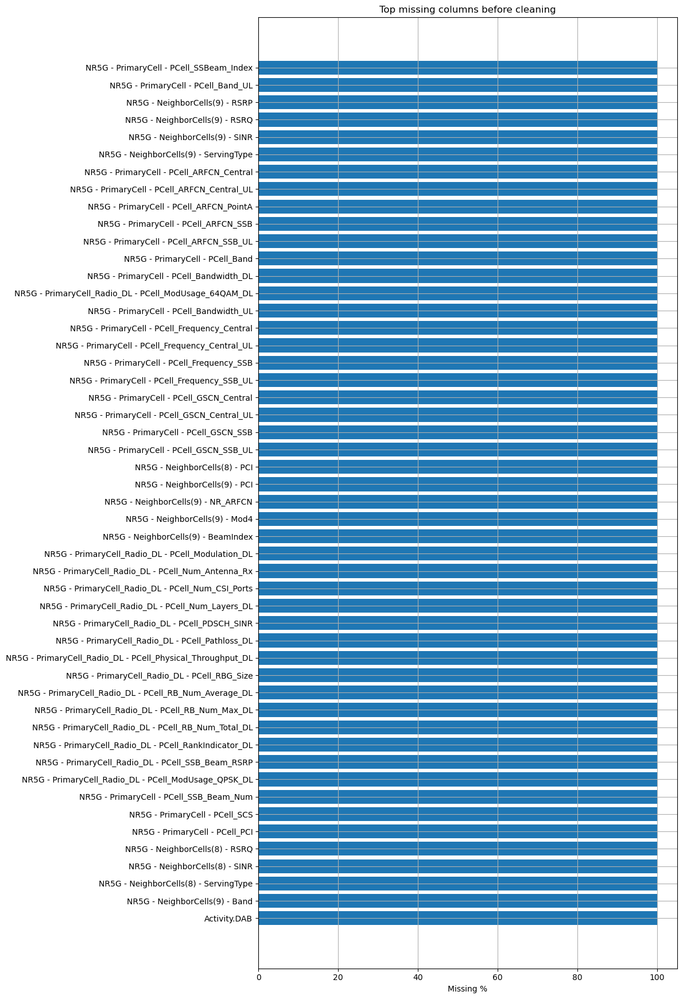

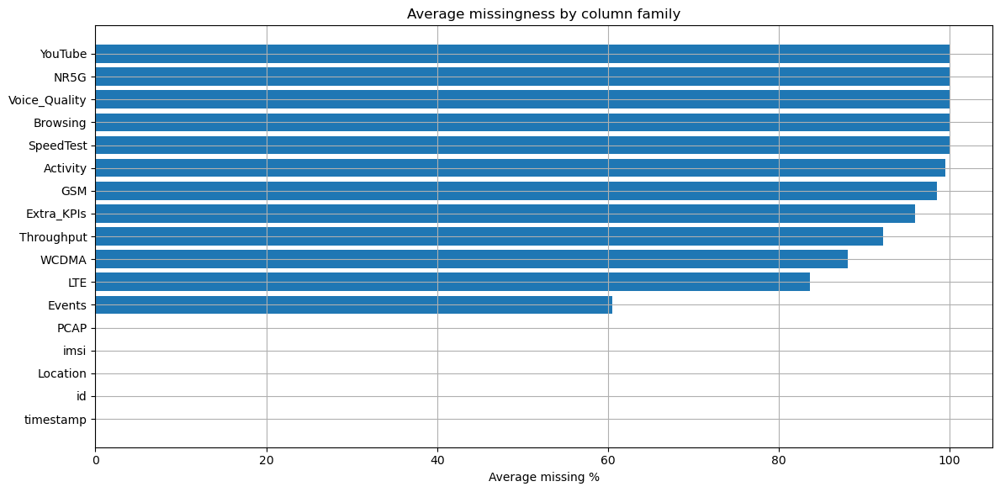

In [10]:
plot_missing_top(raw_profile, "Top missing columns before cleaning", top_n=50)
plot_family_missing(family_summary_raw)

# 4. Protected columns

The 70% rule should not delete columns that are sparse by nature but analytically important.

Examples:

- Event columns are missing when no event happens.
- Activity fields are only filled at activity-level moments.
- Location and timestamp columns are essential for route analysis.
- `id` is essential because it identifies sessions or test chunks.

The protected list below keeps these columns even if they exceed the missing threshold or are constant.

In [11]:
# Exact protected columns expected in your dataset.
EXACT_PROTECTED_COLUMNS = {
    "id",
    "imsi",
    "timestamp",
    "Location - Latitude",
    "Location - Longitude",
    "Location - Speed",
    "Location - Altitude",
    "Location - Accuracy",
    "Activity.Start TimeStamp",
    "Activity.End TimeStamp",
    "Activity.Activity",
    "Activity.Status",
    "Activity.Tech",
    "Activity.Duration",
    "Activity.Throughput",
    "Activity.Power",
    "Activity.Quality",
    "Activity.SINR",
    "Events.Timestamp",
    "Events.category",
    "Events.Tech",
    "Events.titles",
    "Events.description",
    "Events.subject",
}

# Pattern protection catches additional important fields if names vary slightly.
PROTECTED_PATTERNS = [
    r"^Location",
    r"^Events\.",
    r"^Activity\.(Start|End).*TimeStamp$",
    r"^Activity\.(Activity|Status|Tech|Duration|Throughput|Power|Quality|SINR)$",
]

protected_columns = []
for col in drive_raw.columns:
    if col in EXACT_PROTECTED_COLUMNS or any(re.search(p, str(col), flags=re.IGNORECASE) for p in PROTECTED_PATTERNS):
        protected_columns.append(col)

protected_columns = sorted(set(protected_columns), key=lambda c: list(drive_raw.columns).index(c))

protected_report = raw_profile[raw_profile["column"].isin(protected_columns)].copy()
print("Protected columns:", len(protected_columns))
display(protected_report[["column", "family", "dtype", "full_missing_pct", "sample_unique_count"]])
save_table(protected_report, "protected_columns_report.csv")

Protected columns: 24


,column,family,dtype,full_missing_pct,sample_unique_count
800,Activity.Activity,Activity,object,99.284,2
803,Activity.Duration,Activity,float64,99.284,306
804,Activity.End TimeStamp,Activity,object,99.284,465
808,Activity.Power,Activity,float64,99.284,438
810,Activity.Quality,Activity,float64,99.284,345
811,Activity.SINR,Activity,float64,99.284,394
814,Activity.Start TimeStamp,Activity,object,99.284,461
815,Activity.Status,Activity,object,99.284,2
817,Activity.Tech,Activity,object,99.284,8
818,Activity.Throughput,Activity,float64,99.284,242


Saved: Cleaned_EDA_Outputs\protected_columns_report.csv


WindowsPath('Cleaned_EDA_Outputs/protected_columns_report.csv')

# 5. Cleaning plan and removed-column report

The final cleaning logic is:

1. Remove columns with 100% missing values unless protected.
2. Remove columns with more than 70% missing values unless protected.
3. Remove constant columns unless protected.
4. Keep all protected columns.

This creates a **clean base dataset** for EDA. It is not yet the final ML table because ML imputation depends on the exact target problem.

In [12]:
# Build removed-column reasons.
profile = raw_profile.copy()
profile["is_protected"] = profile["column"].isin(protected_columns)
profile["remove_reason"] = ""

# Reason priority: fully missing > above threshold > constant.
profile.loc[(profile["full_missing_pct"] == 100) & (~profile["is_protected"]), "remove_reason"] = "100% missing"
profile.loc[(profile["remove_reason"] == "") & (profile["full_missing_pct"] > MISSING_THRESHOLD) & (~profile["is_protected"]), "remove_reason"] = f">{MISSING_THRESHOLD:.0f}% missing"
profile.loc[(profile["remove_reason"] == "") & (profile["sample_unique_count"] <= 1) & (~profile["is_protected"]), "remove_reason"] = "constant / single unique value"

removed_columns_report = profile[profile["remove_reason"] != ""].copy()
kept_columns_report = profile[profile["remove_reason"] == ""].copy()

removed_columns = removed_columns_report["column"].tolist()
kept_columns = kept_columns_report["column"].tolist()

drive_clean_base = drive_raw[kept_columns].copy()

print("Raw shape:", drive_raw.shape)
print("Clean base shape:", drive_clean_base.shape)
print("Removed columns:", len(removed_columns))
print("Kept columns:", len(kept_columns))

reason_summary = removed_columns_report["remove_reason"].value_counts().reset_index()
reason_summary.columns = ["remove_reason", "columns_removed"]
display(reason_summary)

display(removed_columns_report[["column", "family", "dtype", "full_missing_pct", "sample_unique_count", "is_protected", "remove_reason"]])
display(kept_columns_report[["column", "family", "dtype", "full_missing_pct", "sample_unique_count", "is_protected"]])

save_table(removed_columns_report, "removed_columns_report.csv")
save_table(kept_columns_report, "kept_columns_after_cleaning.csv")
save_table(reason_summary, "removed_columns_reason_summary.csv")

Raw shape: (64949, 1365)
Clean base shape: (64949, 182)
Removed columns: 1183
Kept columns: 182


,remove_reason,columns_removed
0,>70% missing,634
1,100% missing,518
2,constant / single unique value,31


,column,family,dtype,full_missing_pct,sample_unique_count,is_protected,remove_reason
0,Activity.DAB,Activity,float64,100.0,0,False,100% missing
1,Activity.MSISDN,Activity,float64,100.0,0,False,100% missing
2,Activity.Round Trip Time,Activity,float64,100.0,0,False,100% missing
3,Activity.TCP Connection Time,Activity,float64,100.0,0,False,100% missing
4,Browsing.Access Time,Browsing,float64,100.0,0,False,100% missing
...,...,...,...,...,...,...,...
1357,PCAP.initial_rtt,PCAP,int64,0.0,1,False,constant / single unique value
1358,PCAP.out_of_order,PCAP,int64,0.0,1,False,constant / single unique value
1359,PCAP.pkt_loss,PCAP,int64,0.0,1,False,constant / single unique value
1360,PCAP.rtt,PCAP,int64,0.0,1,False,constant / single unique value


,column,family,dtype,full_missing_pct,sample_unique_count,is_protected
800,Activity.Activity,Activity,object,99.284,2,True
803,Activity.Duration,Activity,float64,99.284,306,True
804,Activity.End TimeStamp,Activity,object,99.284,465,True
808,Activity.Power,Activity,float64,99.284,438,True
810,Activity.Quality,Activity,float64,99.284,345,True
...,...,...,...,...,...,...
1350,Location - Longitude,Location,float64,0.000,56717,True
1351,Location - Speed,Location,float64,0.000,44715,True
1362,id,id,object,0.000,546,True
1363,imsi,imsi,int64,0.000,1,True


Saved: Cleaned_EDA_Outputs\removed_columns_report.csv
Saved: Cleaned_EDA_Outputs\kept_columns_after_cleaning.csv
Saved: Cleaned_EDA_Outputs\removed_columns_reason_summary.csv


WindowsPath('Cleaned_EDA_Outputs/removed_columns_reason_summary.csv')

In [13]:
# Create a concise cleaning summary table.
cleaning_summary = pd.DataFrame([
    {"metric": "raw_rows", "value": drive_raw.shape[0]},
    {"metric": "raw_columns", "value": drive_raw.shape[1]},
    {"metric": "clean_rows", "value": drive_clean_base.shape[0]},
    {"metric": "clean_columns", "value": drive_clean_base.shape[1]},
    {"metric": "columns_removed_total", "value": len(removed_columns)},
    {"metric": "columns_kept_total", "value": len(kept_columns)},
    {"metric": "protected_columns_total", "value": len(protected_columns)},
    {"metric": "missing_threshold_pct", "value": MISSING_THRESHOLD},
])

display(cleaning_summary)
save_table(cleaning_summary, "cleaning_summary.csv")

clean_profile = build_data_dictionary(drive_clean_base, name="drive_clean_base", sample_rows=100_000)
display(clean_profile)
save_table(clean_profile, "cleaned_data_dictionary.csv")

family_summary_clean = summarize_column_families(clean_profile)
display(family_summary_clean)
save_table(family_summary_clean, "column_family_summary_after_cleaning.csv")

,metric,value
0,raw_rows,64949.0
1,raw_columns,1365.0
2,clean_rows,64949.0
3,clean_columns,182.0
4,columns_removed_total,1183.0
5,columns_kept_total,182.0
6,protected_columns_total,24.0
7,missing_threshold_pct,70.0


Saved: Cleaned_EDA_Outputs\cleaning_summary.csv


,dataset,column,family,dtype,full_non_null_count,full_missing_count,full_missing_pct,sample_unique_count,sample_unique_pct,sample_non_null_examples,sample_min,sample_max,sample_mean,sample_std,sample_top_values
0,drive_clean_base,Activity.Activity,Activity,object,465,64484,99.284,2,0.430,"[MO Call, MO Call, MO Call, MO Call, MO Call]",NaN,NaN,NaN,NaN,"{'MO Call': 274, 'HTTP/HTTPS Download': 191}"
1,drive_clean_base,Activity.Duration,Activity,float64,465,64484,99.284,306,65.806,"[103147.0, 105144.0, 105168.0, 103140.0, 104140.0]",5.068000e+03,1.802030e+05,1.311655e+05,40634.850613,None
2,drive_clean_base,Activity.End TimeStamp,Activity,object,465,64484,99.284,465,100.000,"[2025-08-25T02:15:24.901000+02:00, 2025-08-25T02:19:18.333000+02:00, 2025-08-25T02:21:23.646000+02:00, 2025-08-25T02:23:26.999000+02:00,...",NaN,NaN,NaN,NaN,"{'2025-08-25T02:15:24.901000+02:00': 1, '2025-08-27T01:55:19.258000+02:00': 1, '2025-08-27T02:48:27.627000+02:00': 1, '2025-08-27T02:45:..."
3,drive_clean_base,Activity.Power,Activity,float64,465,64484,99.284,438,94.194,"[-86.77, -85.33, -79.26, -67.06, -67.01]",-1.173600e+02,-5.707000e+01,-8.411267e+01,12.477169,None
4,drive_clean_base,Activity.Quality,Activity,float64,465,64484,99.284,345,74.194,"[-11.72, -13.44, -8.98, -8.16, -8.02]",-1.454000e+01,9.000000e-02,-9.621957e+00,2.494024,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,drive_clean_base,Location - Longitude,Location,float64,64949,0,0.000,56717,87.325,"[177.3955979, 177.3955976, 177.3955977, 177.3955976, 177.3955972]",1.773674e+02,1.775065e+02,1.774409e+02,0.024549,None
178,drive_clean_base,Location - Speed,Location,float64,64949,0,0.000,44715,68.846,"[0.042176567018032, 0.0148733416572213, 0.0244976095855236, 0.0065126586705446, 0.0178619399666786]",0.000000e+00,6.915600e+01,1.308686e+01,13.502041,None
179,drive_clean_base,id,id,object,64949,0,0.000,546,0.841,"[542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533, 542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533, 54202004122...",NaN,NaN,NaN,NaN,"{'542020041221088+20250826095657+Fiji-Nadi-MO-D!20250826095518': 135, '542020041221088+20250825165336+Fiji-Nadi-MO-D!20250825165217': 13..."
180,drive_clean_base,imsi,imsi,int64,64949,0,0.000,1,0.002,"[542020041221088, 542020041221088, 542020041221088, 542020041221088, 542020041221088]",5.420200e+14,5.420200e+14,5.420200e+14,724.005574,None


Saved: Cleaned_EDA_Outputs\cleaned_data_dictionary.csv


,family,columns,avg_missing_pct,min_missing_pct,max_missing_pct,zero_missing_columns,fully_missing_columns,above_70pct_missing
3,LTE,114,50.887,41.725,66.665,0,0,0
5,WCDMA,42,62.075,59.969,64.969,0,0,0
0,Activity,10,99.284,99.284,99.284,0,0,10
1,Events,6,60.505,56.826,69.816,0,0,0
4,Location,5,0.000,0.000,0.000,5,0,0
2,Extra_KPIs,2,65.748,65.130,66.366,0,0,0
6,id,1,0.000,0.000,0.000,1,0,0
7,imsi,1,0.000,0.000,0.000,1,0,0
8,timestamp,1,0.000,0.000,0.000,1,0,0


Saved: Cleaned_EDA_Outputs\column_family_summary_after_cleaning.csv


WindowsPath('Cleaned_EDA_Outputs/column_family_summary_after_cleaning.csv')

# 6. ID parsing and time ordering

Your `id` looks like this:

```text
542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533
```

This contains useful hidden information, so we extract it into separate columns.

We also sort by `id` and `timestamp` because the screenshot shows that the timestamps are not perfectly ordered in the raw rows.

In [14]:
# Parse the row/sample timestamp and ID features.
drive_clean_base["timestamp"] = pd.to_datetime(drive_clean_base["timestamp"], errors="coerce")
drive_clean_base = add_id_features(drive_clean_base, id_col="id")

# Sort by id and timestamp to recover route/session sequence.
drive_clean_base = drive_clean_base.sort_values(["id", "timestamp"]).reset_index(drop=True)

# Create time features.
drive_clean_base["date"] = drive_clean_base["timestamp"].dt.date
drive_clean_base["hour"] = drive_clean_base["timestamp"].dt.hour
drive_clean_base["minute"] = drive_clean_base["timestamp"].dt.minute

drive_clean_base["sample_gap_seconds"] = drive_clean_base.groupby("id")["timestamp"].diff().dt.total_seconds()
drive_clean_base["session_elapsed_seconds"] = (
    drive_clean_base["timestamp"] - drive_clean_base.groupby("id")["timestamp"].transform("min")
).dt.total_seconds()

# Parse activity timestamps if they exist.
for col in ["Activity.Start TimeStamp", "Activity.End TimeStamp"]:
    if col in drive_clean_base.columns:
        drive_clean_base[col + "_parsed"] = pd.to_datetime(drive_clean_base[col], errors="coerce")

if {"Activity.Start TimeStamp_parsed", "Activity.End TimeStamp_parsed"}.issubset(drive_clean_base.columns):
    drive_clean_base["activity_duration_seconds_from_timestamps"] = (
        drive_clean_base["Activity.End TimeStamp_parsed"] - drive_clean_base["Activity.Start TimeStamp_parsed"]
    ).dt.total_seconds()

print("Shape after adding ID/time features:", drive_clean_base.shape)
display(drive_clean_base[["id", "timestamp", "id_imsi", "id_session_time", "id_route_test_label", "id_location_label", "id_test_type", "id_log_time", "sample_gap_seconds", "session_elapsed_seconds"]].head(20))

Shape after adding ID/time features: (64949, 198)


,id,timestamp,id_imsi,id_session_time,id_route_test_label,id_location_label,id_test_type,id_log_time,sample_gap_seconds,session_elapsed_seconds
0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:29+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,NaN,0.0
1,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:30+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,1.0
2,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:31+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,2.0
3,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:32+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,3.0
4,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:33+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,4.0
5,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:34+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,5.0
6,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:35+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,6.0
7,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:36+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,7.0
8,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:37+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,8.0
9,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:38+02:00,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33,1.0,9.0


,id,id_imsi,id_session_time,id_route_test_label,id_location_label,id_test_type,id_log_time
0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088,2025-08-25 12:16:10,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:15:33
1,542020041221088+20250825122130+Fiji-Nadi-MO-D!20250825121929,542020041221088,2025-08-25 12:21:30,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:19:29
2,542020041221088+20250825122951+Fiji-Nadi-MO-D!20250825122134,542020041221088,2025-08-25 12:29:51,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:21:34
3,542020041221088+20250825123812+Fiji-Nadi-MO-D!20250825122338,542020041221088,2025-08-25 12:38:12,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:23:38
4,542020041221088+20250825124252+Fiji-Nadi-MO-D!20250825122542,542020041221088,2025-08-25 12:42:52,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:25:42
5,542020041221088+20250825124333+Fiji-Nadi-MO-D!20250825122745,542020041221088,2025-08-25 12:43:33,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:27:45
6,542020041221088+20250825124413+Fiji-Nadi-MO-D!20250825122953,542020041221088,2025-08-25 12:44:13,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:29:53
7,542020041221088+20250825124814+Fiji-Nadi-MO-D!20250825123159,542020041221088,2025-08-25 12:48:14,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:31:59
8,542020041221088+20250825125635+Fiji-Nadi-MO-D!20250825123404,542020041221088,2025-08-25 12:56:35,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:34:04
9,542020041221088+20250825133001+Fiji-Nadi-MO-D!20250825123609,542020041221088,2025-08-25 13:30:01,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,2025-08-25 12:36:09


Saved: Cleaned_EDA_Outputs\parsed_id_examples.csv


,sample_gap_seconds
count,64403.000000
mean,1.000124
std,0.011145
min,1.000000
1%,1.000000
5%,1.000000
50%,1.000000
95%,1.000000
99%,1.000000
max,2.000000


Saved: Cleaned_EDA_Outputs\sample_gap_summary.csv


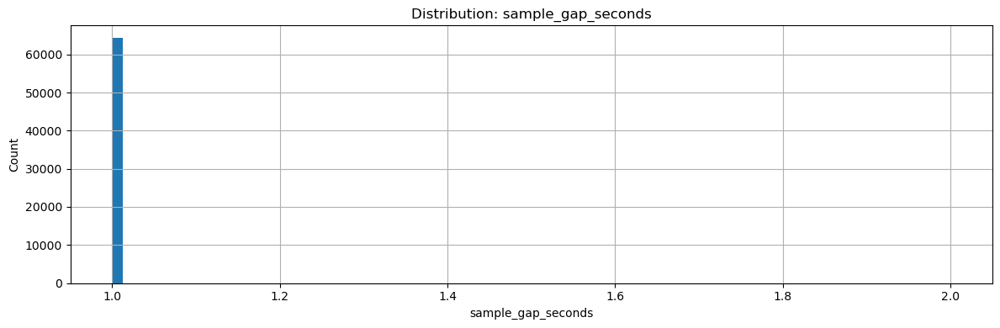

In [15]:
# Save ID parsing examples and timestamp sanity checks.
id_examples = (
    drive_clean_base[["id", "id_imsi", "id_session_time", "id_route_test_label", "id_location_label", "id_test_type", "id_log_time"]]
    .drop_duplicates()
    .reset_index(drop=True)
)
display(id_examples.head(30))
save_table(id_examples, "parsed_id_examples.csv")

sample_gap_summary = drive_clean_base["sample_gap_seconds"].describe(percentiles=[0.01, 0.05, 0.5, 0.95, 0.99]).to_frame("sample_gap_seconds")
display(sample_gap_summary)
save_table(sample_gap_summary.reset_index().rename(columns={"index": "stat"}), "sample_gap_summary.csv")

plot_numeric_hist(drive_clean_base, "sample_gap_seconds", bins=80)

# 7. Technology and measurement availability

Before deep analysis, we need to know what the drive-test file actually contains.

This section creates flags such as:

- `has_lte_measurement`
- `has_wcdma_measurement`
- `has_nr5g_measurement`
- `has_event`
- `has_valid_location`
- `has_lte_throughput`

This is especially important because the previous profile suggested the NR5G columns may be 100% missing.

In [16]:
# Key columns detected from the previous profile and common drive-test naming.
LTE_RSRP_COL = first_existing(drive_clean_base, ["LTE - PrimaryCell Radio - RSRP"])
LTE_RSRQ_COL = first_existing(drive_clean_base, ["LTE - PrimaryCell Radio - PCell_RSRQ"])
LTE_SINR_COL = first_existing(drive_clean_base, ["LTE - PrimaryCell Radio - PCell_SINR"])
LTE_RSSI_COL = first_existing(drive_clean_base, ["LTE - PrimaryCell Radio - PCell_RSSI"])
LTE_PCI_COL = first_existing(drive_clean_base, ["LTE - Serving - PCI", "LTE - PrimaryCell - PCell_PCI"])
LTE_EARFCN_COL = first_existing(drive_clean_base, ["LTE - Serving - EARFCN_DL", "LTE - PrimaryCell - PCell_EARFCN_DL"])
LTE_BAND_COL = first_existing(drive_clean_base, ["LTE - Serving - Band", "LTE - PrimaryCell - PCell_Band"])
LTE_DL_TP_COL = first_existing(drive_clean_base, ["LTE.LTE_Data_KPI.Agg_Throughput_DL", "LTE.DownlinkMeasurements.Throughput_DL", "LTE - PrimaryCell - PCell_Throughput"])
LTE_UL_TP_COL = first_existing(drive_clean_base, ["LTE.LTE_Data_KPI.Agg_Throughput_UL", "LTE.UplinkMeasurements.PUSCH_Throughput"])

WCDMA_RSCP_COL = first_existing(drive_clean_base, ["WCDMA - DownlinkMeasurements - RSCP", "WCDMA - WCDMACellsTable(0) - RSCP"])
WCDMA_ECNO_COL = first_existing(drive_clean_base, ["WCDMA - DownlinkMeasurements - EcNo", "WCDMA - WCDMACellsTable(0) - EcNo"])
WCDMA_PSC_COL = first_existing(drive_clean_base, ["WCDMA - ServingCell - PSC", "WCDMA - WCDMACellsTable(0) - PSC"])
WCDMA_UARFCN_COL = first_existing(drive_clean_base, ["WCDMA - ServingCell - UARFCN", "WCDMA - WCDMACellsTable(0) - UARFCN"])

NR5G_PCI_COL = first_existing(drive_clean_base, ["NR5G - Serving(0) - PCI", "NR5G - PrimaryCell - PCell_PCI"])
NR5G_RSRP_COL = first_existing(drive_clean_base, ["NR5G - Serving(0) - RSRP"])
NR5G_RSRQ_COL = first_existing(drive_clean_base, ["NR5G - Serving(0) - RSRQ"])
NR5G_SINR_COL = first_existing(drive_clean_base, ["NR5G - Serving(0) - SINR"])
NR5G_ARFCN_COL = first_existing(drive_clean_base, ["NR5G - Serving(0) - NR_ARFCN"])

LAT_COL = "Location - Latitude"
LON_COL = "Location - Longitude"
SPEED_COL = "Location - Speed"
ACCURACY_COL = "Location - Accuracy"

key_columns = pd.DataFrame([
    {"meaning": "LTE RSRP", "column": LTE_RSRP_COL},
    {"meaning": "LTE RSRQ", "column": LTE_RSRQ_COL},
    {"meaning": "LTE SINR", "column": LTE_SINR_COL},
    {"meaning": "LTE PCI", "column": LTE_PCI_COL},
    {"meaning": "LTE EARFCN DL", "column": LTE_EARFCN_COL},
    {"meaning": "LTE Band", "column": LTE_BAND_COL},
    {"meaning": "LTE DL Throughput", "column": LTE_DL_TP_COL},
    {"meaning": "LTE UL Throughput", "column": LTE_UL_TP_COL},
    {"meaning": "WCDMA RSCP", "column": WCDMA_RSCP_COL},
    {"meaning": "WCDMA EcNo", "column": WCDMA_ECNO_COL},
    {"meaning": "WCDMA PSC", "column": WCDMA_PSC_COL},
    {"meaning": "WCDMA UARFCN", "column": WCDMA_UARFCN_COL},
    {"meaning": "NR5G PCI", "column": NR5G_PCI_COL},
    {"meaning": "NR5G RSRP", "column": NR5G_RSRP_COL},
    {"meaning": "NR5G RSRQ", "column": NR5G_RSRQ_COL},
    {"meaning": "NR5G SINR", "column": NR5G_SINR_COL},
    {"meaning": "NR5G ARFCN", "column": NR5G_ARFCN_COL},
])

display(key_columns)
save_table(key_columns, "detected_key_columns.csv")

,meaning,column
0,LTE RSRP,LTE - PrimaryCell Radio - RSRP
1,LTE RSRQ,LTE - PrimaryCell Radio - PCell_RSRQ
2,LTE SINR,LTE - PrimaryCell Radio - PCell_SINR
3,LTE PCI,LTE - Serving - PCI
4,LTE EARFCN DL,LTE - Serving - EARFCN_DL
5,LTE Band,LTE - Serving - Band
6,LTE DL Throughput,LTE.LTE_Data_KPI.Agg_Throughput_DL
7,LTE UL Throughput,LTE.LTE_Data_KPI.Agg_Throughput_UL
8,WCDMA RSCP,WCDMA - DownlinkMeasurements - RSCP
9,WCDMA EcNo,WCDMA - DownlinkMeasurements - EcNo


Saved: Cleaned_EDA_Outputs\detected_key_columns.csv


WindowsPath('Cleaned_EDA_Outputs/detected_key_columns.csv')

In [17]:
# Create availability flags without filling KPI values.
drive_clean_base["has_valid_location"] = drive_clean_base[[LAT_COL, LON_COL]].notna().all(axis=1) if {LAT_COL, LON_COL}.issubset(drive_clean_base.columns) else False

drive_clean_base["has_lte_measurement"] = False
for c in [LTE_RSRP_COL, LTE_RSRQ_COL, LTE_SINR_COL, LTE_PCI_COL, LTE_EARFCN_COL]:
    if c in drive_clean_base.columns:
        drive_clean_base["has_lte_measurement"] |= drive_clean_base[c].notna()

drive_clean_base["has_wcdma_measurement"] = False
for c in [WCDMA_RSCP_COL, WCDMA_ECNO_COL, WCDMA_PSC_COL, WCDMA_UARFCN_COL]:
    if c in drive_clean_base.columns:
        drive_clean_base["has_wcdma_measurement"] |= drive_clean_base[c].notna()

drive_clean_base["has_nr5g_measurement"] = False
for c in [NR5G_RSRP_COL, NR5G_RSRQ_COL, NR5G_SINR_COL, NR5G_PCI_COL, NR5G_ARFCN_COL]:
    if c in drive_clean_base.columns:
        drive_clean_base["has_nr5g_measurement"] |= drive_clean_base[c].notna()

event_cols = [c for c in ["Events.Timestamp", "Events.category", "Events.Tech", "Events.titles", "Events.description", "Events.subject"] if c in drive_clean_base.columns]
drive_clean_base["has_event"] = drive_clean_base[event_cols].notna().any(axis=1) if event_cols else False

drive_clean_base["has_lte_throughput"] = False
for c in [LTE_DL_TP_COL, LTE_UL_TP_COL]:
    if c in drive_clean_base.columns:
        drive_clean_base["has_lte_throughput"] |= drive_clean_base[c].notna()

availability_flags = [
    "has_valid_location",
    "has_lte_measurement",
    "has_wcdma_measurement",
    "has_nr5g_measurement",
    "has_event",
    "has_lte_throughput",
]

availability_summary = pd.DataFrame([
    {
        "flag": flag,
        "true_rows": int(drive_clean_base[flag].sum()),
        "true_pct": round(float(drive_clean_base[flag].mean() * 100), 3),
        "false_rows": int((~drive_clean_base[flag]).sum()),
    }
    for flag in availability_flags
])

display(availability_summary)
save_table(availability_summary, "technology_availability_summary.csv")

,flag,true_rows,true_pct,false_rows
0,has_valid_location,64949,100.000,0
1,has_lte_measurement,37588,57.873,27361
2,has_wcdma_measurement,25469,39.214,39480
3,has_nr5g_measurement,0,0.000,64949
4,has_event,28041,43.174,36908
5,has_lte_throughput,37517,57.764,27432


Saved: Cleaned_EDA_Outputs\technology_availability_summary.csv


WindowsPath('Cleaned_EDA_Outputs/technology_availability_summary.csv')

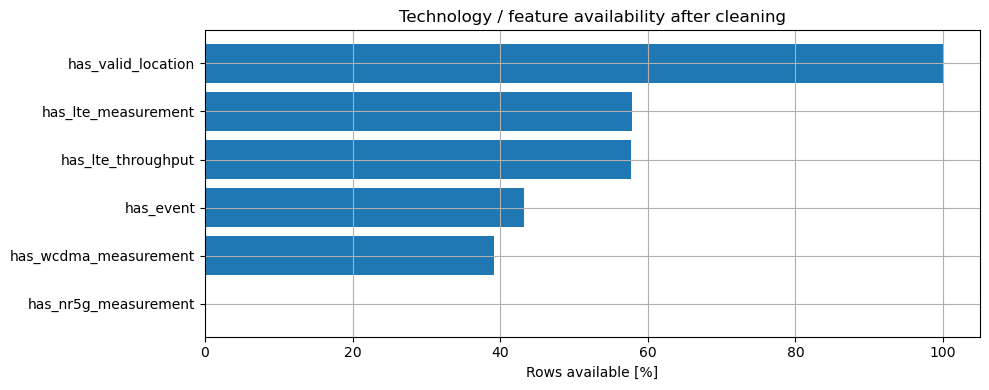

In [18]:
# Visualize availability flags.
avail_plot = availability_summary.sort_values("true_pct")
plt.figure(figsize=(10, 4))
plt.barh(avail_plot["flag"], avail_plot["true_pct"])
plt.xlabel("Rows available [%]")
plt.title("Technology / feature availability after cleaning")
plt.tight_layout()
plt.show()

# 8. Missing-value handling strategy after cleaning

We still do **not** fill all missing values globally.

Why?

In drive-test data, missing values often mean that a technology/layer/test was not active at that timestamp.

Examples:

| Missing field | Possible meaning |
|---|---|
| LTE KPI missing | Device was not on LTE at this sample |
| WCDMA KPI missing | Device was not on WCDMA at this sample |
| Event missing | No event occurred at this sample |
| Activity missing | No activity-level record was emitted at this exact row |
| GPS missing | Location issue; remove only for map/geospatial analysis |

So the notebook creates flags and keeps NaN values for EDA. For ML later, we will build a separate target-specific table.

In [19]:
# Light missing-value treatment for categorical/event analysis only.
# We do not overwrite the original KPI columns.
drive_clean_base["event_category_clean"] = drive_clean_base["Events.category"].fillna("No Event") if "Events.category" in drive_clean_base.columns else "No Event"
drive_clean_base["event_tech_clean"] = drive_clean_base["Events.Tech"].fillna("No Event") if "Events.Tech" in drive_clean_base.columns else "No Event"

# These KPI bins are new derived columns. The original numeric values remain unchanged.
def bin_rsrp(x):
    if pd.isna(x): return np.nan
    if x >= -80: return "Excellent"
    if x >= -90: return "Good"
    if x >= -100: return "Fair"
    return "Poor"


def bin_rsrq(x):
    if pd.isna(x): return np.nan
    if x >= -10: return "Excellent"
    if x >= -15: return "Good"
    if x >= -20: return "Fair"
    return "Poor"


def bin_sinr(x):
    if pd.isna(x): return np.nan
    if x >= 20: return "Excellent"
    if x >= 13: return "Good"
    if x >= 0: return "Fair"
    return "Poor"

if LTE_RSRP_COL:
    drive_clean_base["lte_rsrp_quality_bin"] = pd.to_numeric(drive_clean_base[LTE_RSRP_COL], errors="coerce").map(bin_rsrp)
if LTE_RSRQ_COL:
    drive_clean_base["lte_rsrq_quality_bin"] = pd.to_numeric(drive_clean_base[LTE_RSRQ_COL], errors="coerce").map(bin_rsrq)
if LTE_SINR_COL:
    drive_clean_base["lte_sinr_quality_bin"] = pd.to_numeric(drive_clean_base[LTE_SINR_COL], errors="coerce").map(bin_sinr)

quality_cols = [c for c in ["lte_rsrp_quality_bin", "lte_rsrq_quality_bin", "lte_sinr_quality_bin"] if c in drive_clean_base.columns]
for col in quality_cols:
    print("\n", col)
    display(drive_clean_base[col].value_counts(dropna=False).to_frame("rows"))


 lte_rsrp_quality_bin


,rows
lte_rsrp_quality_bin,
NaN,27361
Poor,12719
Fair,12486
Good,8385
Excellent,3998



 lte_rsrq_quality_bin


,rows
lte_rsrq_quality_bin,
NaN,27361
Good,18366
Excellent,17797
Fair,1346
Poor,79



 lte_sinr_quality_bin


,rows
lte_sinr_quality_bin,
NaN,27361
Fair,20036
Good,10924
Excellent,5986
Poor,642


# 9. LTE-focused EDA

The first data profile showed that LTE columns are the most useful radio columns in this file. This section focuses on LTE coverage, quality, PCI, band, throughput, and neighbor context.

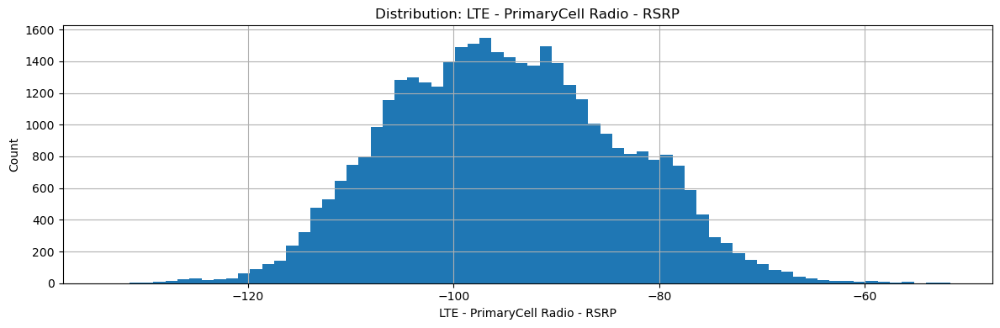

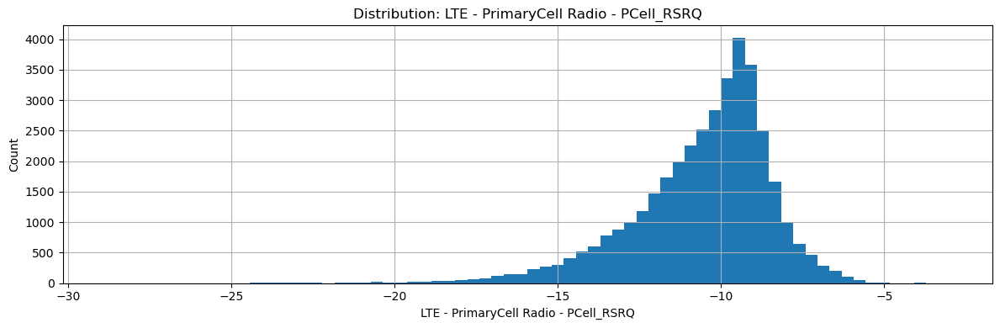

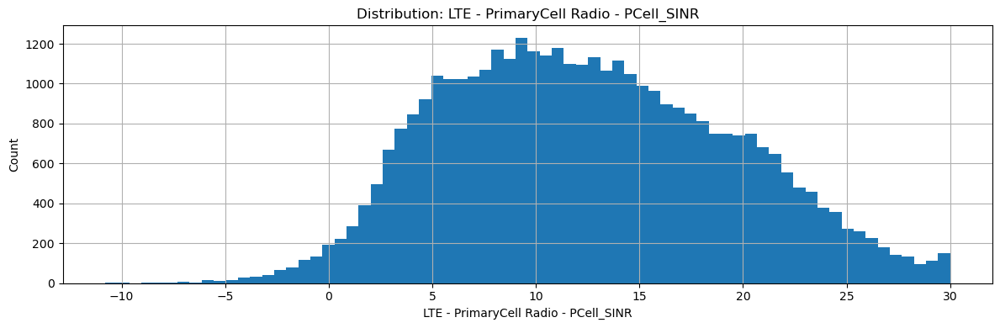

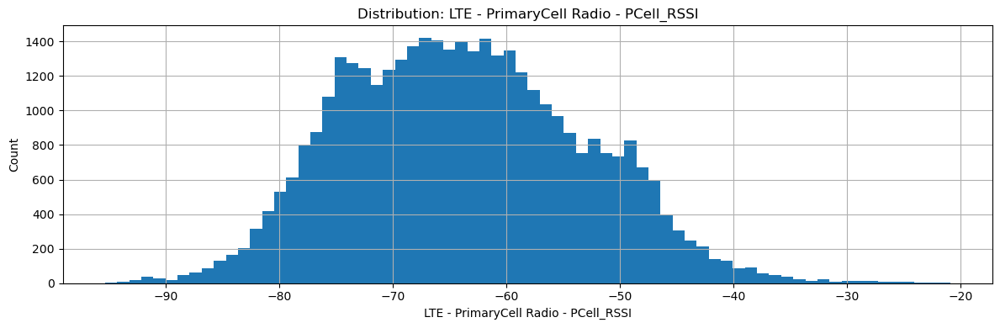

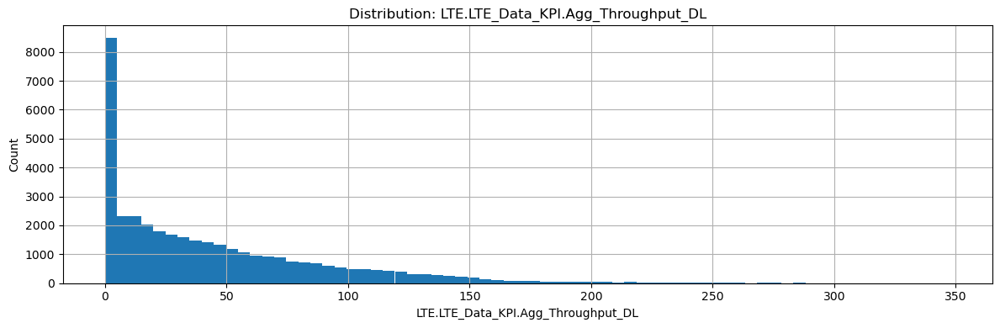

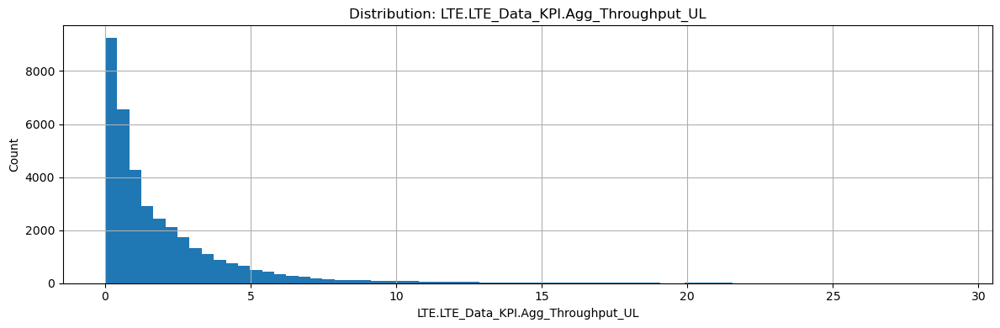

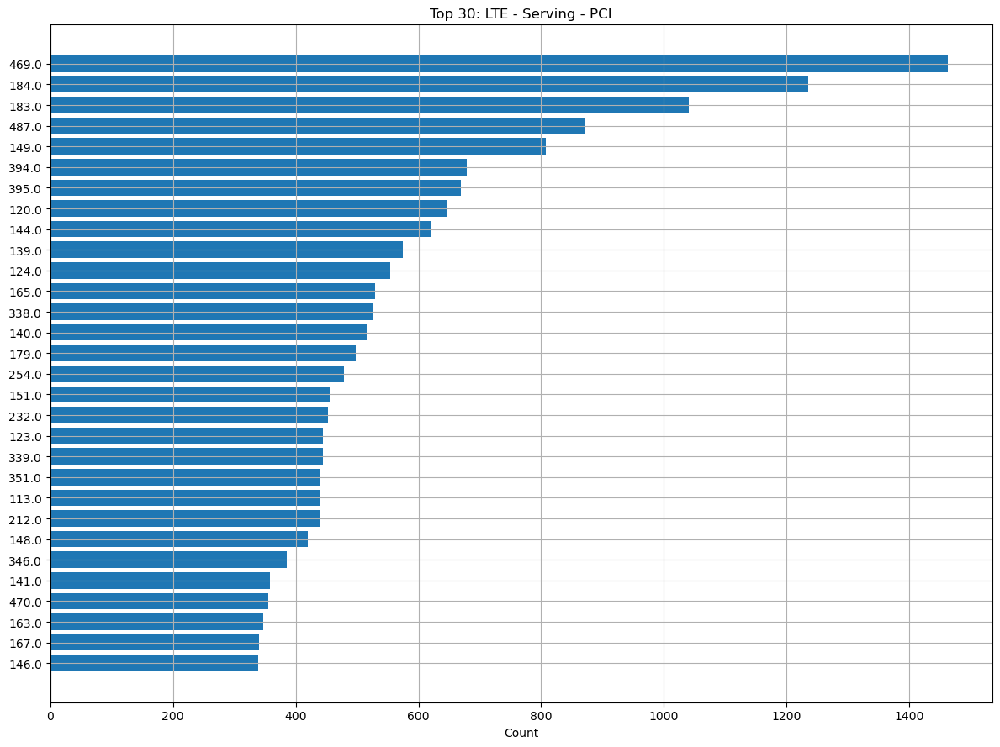

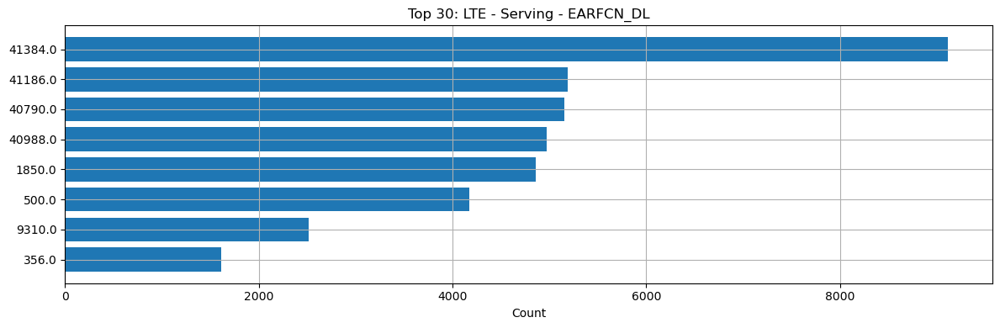

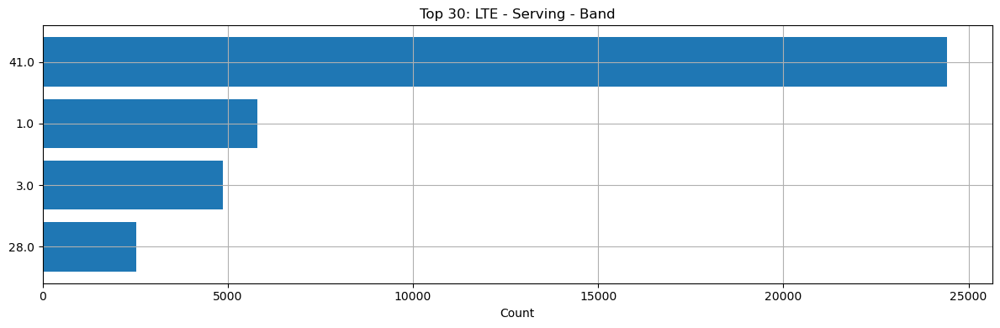

In [20]:
# LTE numeric distributions.
for col in [LTE_RSRP_COL, LTE_RSRQ_COL, LTE_SINR_COL, LTE_RSSI_COL, LTE_DL_TP_COL, LTE_UL_TP_COL]:
    if col:
        plot_numeric_hist(drive_clean_base, col, bins=70)

# LTE categorical / identity distributions.
for col in [LTE_PCI_COL, LTE_EARFCN_COL, LTE_BAND_COL]:
    if col:
        plot_top_categories(drive_clean_base, col, top_n=30)

In [21]:
# LTE summary by PCI, useful for finding problematic cells.
lte_group_cols = [c for c in [LTE_PCI_COL] if c]
lte_metric_cols = [c for c in [LTE_RSRP_COL, LTE_RSRQ_COL, LTE_SINR_COL, LTE_DL_TP_COL, LTE_UL_TP_COL] if c]

if LTE_PCI_COL and lte_metric_cols:
    lte_by_pci = drive_clean_base.dropna(subset=[LTE_PCI_COL]).groupby(LTE_PCI_COL).agg(
        rows=(LTE_PCI_COL, "size"),
        first_seen=("timestamp", "min"),
        last_seen=("timestamp", "max"),
        mean_rsrp=(LTE_RSRP_COL, "mean") if LTE_RSRP_COL else (LTE_PCI_COL, "size"),
        p10_rsrp=(LTE_RSRP_COL, lambda x: pd.to_numeric(x, errors="coerce").quantile(0.10)) if LTE_RSRP_COL else (LTE_PCI_COL, "size"),
        mean_sinr=(LTE_SINR_COL, "mean") if LTE_SINR_COL else (LTE_PCI_COL, "size"),
        p10_sinr=(LTE_SINR_COL, lambda x: pd.to_numeric(x, errors="coerce").quantile(0.10)) if LTE_SINR_COL else (LTE_PCI_COL, "size"),
        mean_dl_tp=(LTE_DL_TP_COL, "mean") if LTE_DL_TP_COL else (LTE_PCI_COL, "size"),
    ).reset_index().sort_values("rows", ascending=False)

    display(lte_by_pci.head(40))
    save_table(lte_by_pci, "lte_summary_by_pci.csv")
else:
    print("LTE PCI/metric columns are not available enough for LTE-by-PCI summary.")

,LTE - Serving - PCI,rows,first_seen,last_seen,mean_rsrp,p10_rsrp,mean_sinr,p10_sinr,mean_dl_tp
183,469.0,1462,2025-08-25 02:29:53+02:00,2025-08-29 00:36:44+02:00,-103.340319,-109.894841,7.055627,2.755652,22.354061
76,184.0,1235,2025-08-26 04:18:55+02:00,2025-08-28 02:16:12+02:00,-85.132266,-102.934810,17.963227,10.303467,21.655363
75,183.0,1041,2025-08-26 01:08:08+02:00,2025-08-28 04:26:02+02:00,-83.608375,-94.726070,14.172416,6.045361,30.415760
185,487.0,872,2025-08-25 02:58:26+02:00,2025-08-28 00:28:48+02:00,-103.232744,-112.953455,11.780451,3.124098,18.620836
47,149.0,807,2025-08-25 02:21:28+02:00,2025-08-27 02:47:16+02:00,-86.476503,-99.182614,17.163157,8.276697,81.751810
163,394.0,679,2025-08-25 02:36:03+02:00,2025-08-28 04:37:02+02:00,-93.473195,-104.069033,17.089567,8.334075,54.927281
164,395.0,669,2025-08-25 02:25:35+02:00,2025-08-29 00:14:00+02:00,-95.510894,-107.002190,12.451271,3.791516,27.207755
18,120.0,646,2025-08-25 03:17:17+02:00,2025-08-27 05:33:52+02:00,-94.654491,-106.717475,17.522782,5.545943,62.574812
42,144.0,621,2025-08-25 03:53:56+02:00,2025-08-27 02:55:41+02:00,-97.175393,-105.880104,14.726564,7.900000,53.196253
37,139.0,574,2025-08-26 01:08:11+02:00,2025-08-28 04:26:43+02:00,-89.841668,-98.217423,11.041876,5.656462,42.905771


Saved: Cleaned_EDA_Outputs\lte_summary_by_pci.csv


# 10. WCDMA-focused EDA

WCDMA columns are also meaningful in this file. This can help explain fallback, call behavior, legacy coverage, or mobility behavior.

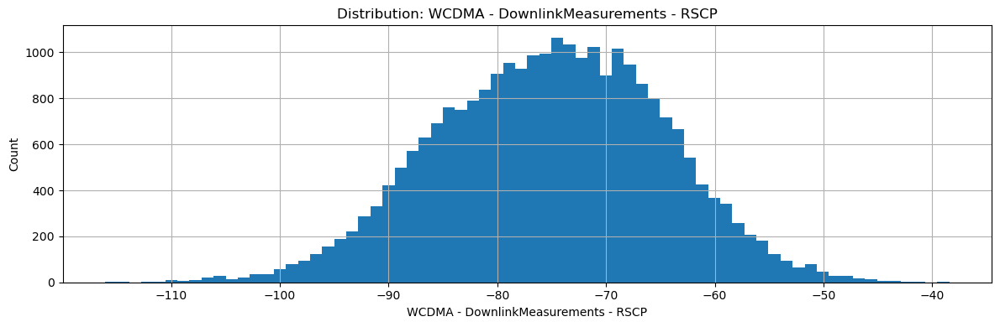

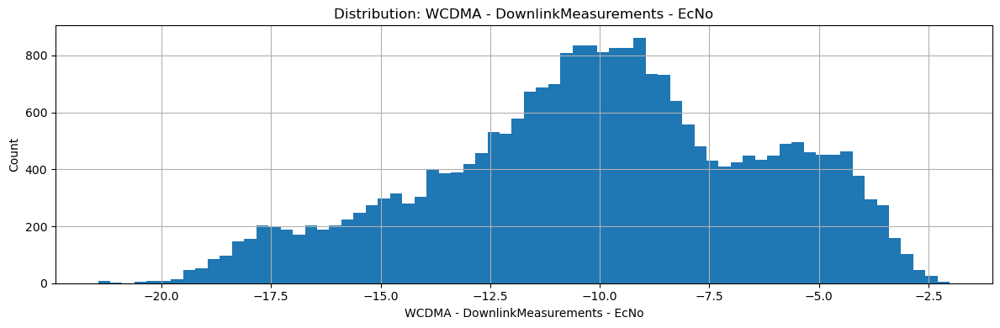

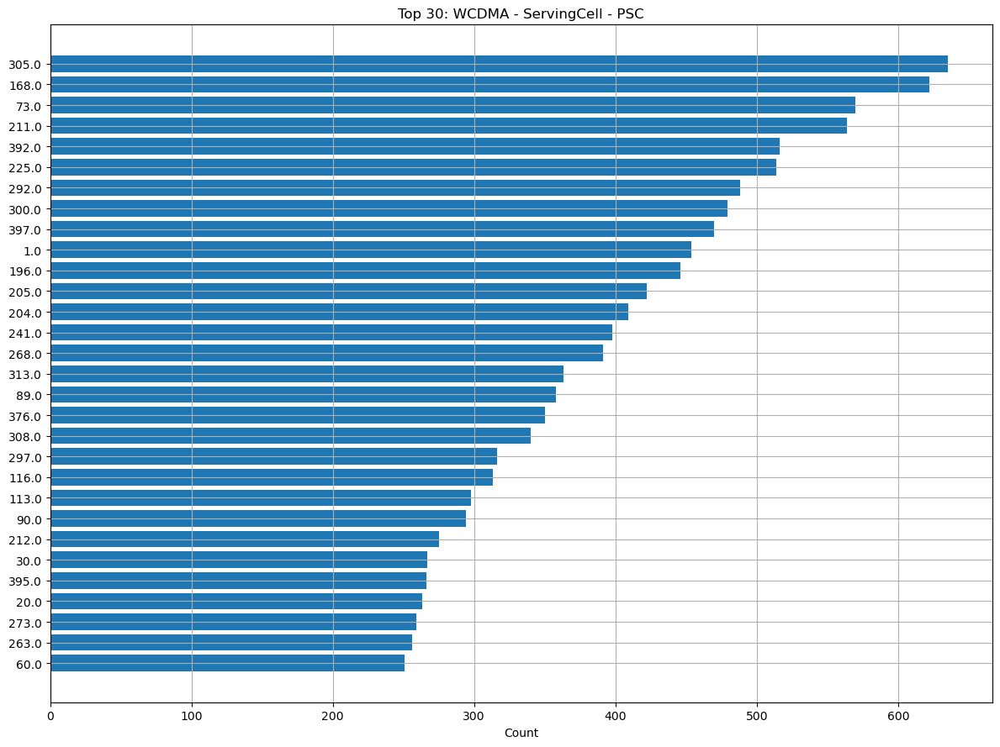

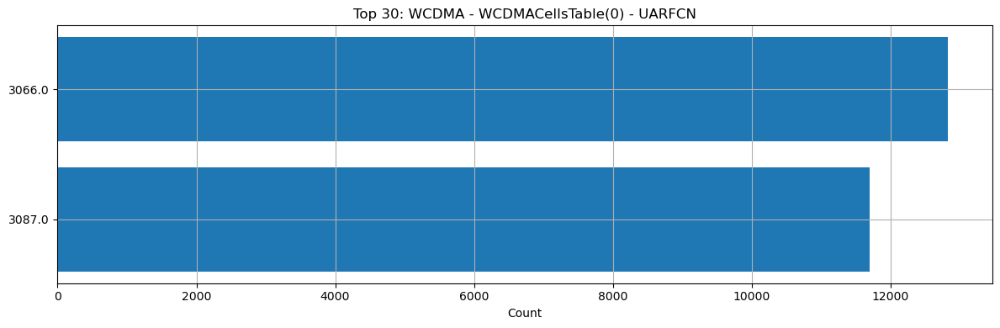

,WCDMA - ServingCell - PSC,rows,mean_rscp,p10_rscp,mean_ecno,p10_ecno
127,305.0,635,-70.692992,-79.729520,-11.703086,-15.473470
70,168.0,622,-67.451622,-79.418590,-9.391653,-11.635402
40,73.0,570,-88.052594,-101.930547,-11.918816,-16.136849
91,211.0,564,-77.402759,-92.651525,-10.384457,-14.689158
150,392.0,516,-74.888186,-88.858508,-9.264929,-13.588548
99,225.0,514,-77.712067,-88.744970,-10.174473,-16.544639
123,292.0,488,-81.427661,-89.661772,-12.190929,-15.510132
126,300.0,479,-75.182849,-86.663497,-9.557303,-13.905259
152,397.0,470,-79.208993,-91.162796,-9.627815,-15.318282
1,1.0,454,-73.808170,-85.586680,-8.711825,-11.564561


Saved: Cleaned_EDA_Outputs\wcdma_summary_by_psc.csv


In [22]:
# WCDMA distributions and top values.
for col in [WCDMA_RSCP_COL, WCDMA_ECNO_COL]:
    if col:
        plot_numeric_hist(drive_clean_base, col, bins=70)

for col in [WCDMA_PSC_COL, WCDMA_UARFCN_COL]:
    if col:
        plot_top_categories(drive_clean_base, col, top_n=30)

if WCDMA_PSC_COL:
    wcdma_metrics = [c for c in [WCDMA_RSCP_COL, WCDMA_ECNO_COL] if c]
    if wcdma_metrics:
        agg_dict = {"rows": (WCDMA_PSC_COL, "size")}
        if WCDMA_RSCP_COL:
            agg_dict["mean_rscp"] = (WCDMA_RSCP_COL, "mean")
            agg_dict["p10_rscp"] = (WCDMA_RSCP_COL, lambda x: pd.to_numeric(x, errors="coerce").quantile(0.10))
        if WCDMA_ECNO_COL:
            agg_dict["mean_ecno"] = (WCDMA_ECNO_COL, "mean")
            agg_dict["p10_ecno"] = (WCDMA_ECNO_COL, lambda x: pd.to_numeric(x, errors="coerce").quantile(0.10))
        wcdma_by_psc = drive_clean_base.dropna(subset=[WCDMA_PSC_COL]).groupby(WCDMA_PSC_COL).agg(**agg_dict).reset_index().sort_values("rows", ascending=False)
        display(wcdma_by_psc.head(40))
        save_table(wcdma_by_psc, "wcdma_summary_by_psc.csv")
else:
    print("WCDMA PSC column not available.")

# 11. Event analysis

The `Events.*` columns contain multiple events separated by `$$$$`. We will expand them into a long table where each row is one event.

This is very useful for root cause analysis because we can later connect events to poor signal, poor SINR, throughput drops, CSFB, handovers, call setup, and failures.

In [23]:
events_long = build_events_long(drive_clean_base, id_col="id", sample_time_col="timestamp")
print("Events long shape:", events_long.shape)

display(events_long.head(30))
if not events_long.empty:
    save_table(events_long, "events_long.csv")

    event_summary_tables = {}
    for col in ["Events.category", "Events.Tech", "Events.titles", "Events.subject"]:
        if col in events_long.columns:
            summary = events_long[col].fillna("Unknown").astype(str).value_counts().reset_index()
            summary.columns = [col, "event_count"]
            event_summary_tables[col] = summary
            display(summary.head(30))
            save_table(summary, f"event_summary_{col.replace('.', '_').replace(' ', '_')}.csv")
else:
    print("No events to expand.")

Events long shape: (102302, 12)


,source_index,event_order_in_sample,id,sample_timestamp,Events.Timestamp,Events.category,Events.Tech,Events.titles,Events.description,Events.subject,event_timestamp,event_delay_from_sample_seconds
0,2,0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:31+02:00,2025-08-25T02:13:31.151000+02:00,Script,LTE,Start,"{""name"":""Fiji-Nadi-MO-D"",""description"":""CSFB-90-10"",""steps"":[{""BM"":false,""id"":""0"",""Type"":""MO_Call"",""Number"":""+6797013801"",""MT_IMSI"":"""",""...",Fiji-Nadi-MO-D,2025-08-25 02:13:31.151000+02:00,0.151000
1,2,1,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:31+02:00,2025-08-25T02:13:31.154000+02:00,Script,LTE,Loop Start,1,nan,2025-08-25 02:13:31.154000+02:00,0.154000
2,2,2,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:31+02:00,2025-08-25T02:13:31.157000+02:00,Script,LTE,Lock RAT,AUTO,Start,2025-08-25 02:13:31.157000+02:00,0.157000
3,10,0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:39+02:00,2025-08-25T02:13:39.210000+02:00,Script,LTE,Lock RAT,AUTO,End,2025-08-25 02:13:39.210000+02:00,0.210000
4,10,1,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:39+02:00,2025-08-25T02:13:39.213000+02:00,Script,LTE,MO Call,+6797013801,Start,2025-08-25 02:13:39.213000+02:00,0.213000
5,10,2,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:39+02:00,2025-08-25T02:13:39.214000+02:00,Script,LTE,MO Call,,MT Available,2025-08-25 02:13:39.214000+02:00,0.214000
6,12,0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:41+02:00,2025-08-25T02:13:41.953000+02:00,Network,LTE,Idle Mode,NaN,NaN,2025-08-25 02:13:41.953000+02:00,0.953000
7,13,0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:42+02:00,2025-08-25T02:13:41.876550+02:00,Network,LTE,Outgoing Call Attempt,CSFB,nan,2025-08-25 02:13:41.876550+02:00,-0.123450
8,13,1,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:42+02:00,2025-08-25T02:13:41.953151+02:00,Network,LTE,ERRC Connection Complete,,nan,2025-08-25 02:13:41.953151+02:00,-0.046849
9,13,2,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:13:42+02:00,2025-08-25T02:13:42.608000+02:00,Network,LTE,Dedicated Mode,,nan,2025-08-25 02:13:42.608000+02:00,0.608000


Saved: Cleaned_EDA_Outputs\events_long.csv


,Events.category,event_count
0,Network,93873
1,Script,5930
2,Logs,2468
3,Device,31


Saved: Cleaned_EDA_Outputs\event_summary_Events_category.csv


,Events.Tech,event_count
0,LTE,76771
1,WCDMA,24895
2,GSM,636


Saved: Cleaned_EDA_Outputs\event_summary_Events_Tech.csv


,Events.titles,event_count
0,Event A3,5758
1,Event A1,4980
2,LTE CA Init,4365
3,LTE CA Complete,4363
4,UMTS AS Update Attempt,4187
5,UMTS AS Update Complete,4187
6,LTE RACH Msg1,4168
7,Event A6,3734
8,Event 1A,3493
9,LTE RACH Msg3,2959


Saved: Cleaned_EDA_Outputs\event_summary_Events_titles.csv


,Events.subject,event_count
0,nan,85474
1,Unknown,8437
2,Start,3281
3,End,2636
4,Failed (Timeout),1105
5,Failed,694
6,Success,316
7,MT Available,274
8,Restart,31
9,Failed (Error in Session),23


Saved: Cleaned_EDA_Outputs\event_summary_Events_subject.csv


,event_hour,event_count
0,2025-08-25 02:00:00+02:00,3934
1,2025-08-25 03:00:00+02:00,4609
2,2025-08-25 04:00:00+02:00,4213
3,2025-08-25 05:00:00+02:00,4573
4,2025-08-25 06:00:00+02:00,2516


Saved: Cleaned_EDA_Outputs\event_timeline_hourly.csv


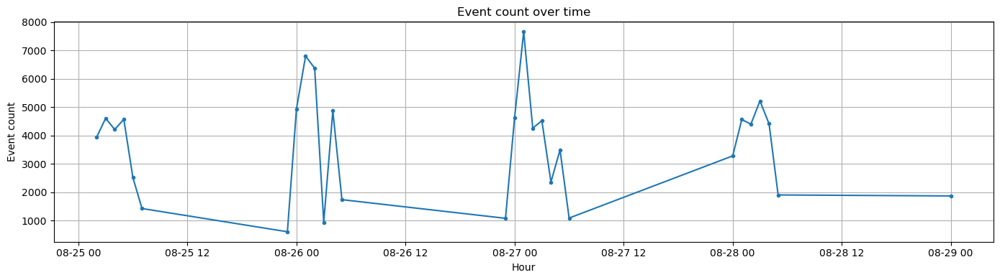

In [24]:
# Event timeline by hour.
if not events_long.empty and "event_timestamp" in events_long.columns:
    events_long["event_hour"] = events_long["event_timestamp"].dt.floor("H")
    event_timeline = events_long.groupby("event_hour").size().reset_index(name="event_count")
    display(event_timeline.head())
    save_table(event_timeline, "event_timeline_hourly.csv")

    plt.figure(figsize=(14, 4))
    plt.plot(event_timeline["event_hour"], event_timeline["event_count"], marker=".")
    plt.title("Event count over time")
    plt.xlabel("Hour")
    plt.ylabel("Event count")
    plt.tight_layout()
    plt.show()

# 12. Activity-level table

Activity columns are sparse because they appear only for activity-level records. Instead of deleting them, we extract them into a separate table.

In [25]:
activity_cols = [c for c in drive_clean_base.columns if str(c).startswith("Activity.")]
activity_key_cols = [c for c in ["id", "timestamp", "id_route_test_label", "id_test_type"] if c in drive_clean_base.columns]

if activity_cols:
    activity_table = drive_clean_base[activity_key_cols + activity_cols].copy()
    activity_table = activity_table[activity_table[activity_cols].notna().any(axis=1)].reset_index(drop=True)
    print("Activity table shape:", activity_table.shape)
    display(activity_table.head(30))
    save_table(activity_table, "activity_table.csv")

    if "Activity.Activity" in activity_table.columns:
        activity_type_summary = activity_table["Activity.Activity"].fillna("Unknown").astype(str).value_counts().reset_index()
        activity_type_summary.columns = ["activity", "rows"]
        display(activity_type_summary)
        save_table(activity_type_summary, "activity_type_summary.csv")
else:
    activity_table = pd.DataFrame()
    print("No Activity.* columns found.")

Activity table shape: (465, 16)


,id,timestamp,id_route_test_label,id_test_type,Activity.Activity,Activity.Duration,Activity.End TimeStamp,Activity.Power,Activity.Quality,Activity.SINR,Activity.Start TimeStamp,Activity.Status,Activity.Tech,Activity.Throughput,Activity.Start TimeStamp_parsed,Activity.End TimeStamp_parsed
0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,2025-08-25 02:15:24+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,103147.0,2025-08-25T02:15:24.901000+02:00,-86.77,-11.72,6.58,2025-08-25T02:13:41.754000+02:00,Success,HSPA+,88.0,2025-08-25 02:13:41.754000+02:00,2025-08-25 02:15:24.901000+02:00
1,542020041221088+20250825122130+Fiji-Nadi-MO-D!20250825121929,2025-08-25 02:19:18+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,105144.0,2025-08-25T02:19:18.333000+02:00,-85.33,-13.44,5.56,2025-08-25T02:17:33.189000+02:00,Success,HSPA+,32.0,2025-08-25 02:17:33.189000+02:00,2025-08-25 02:19:18.333000+02:00
2,542020041221088+20250825122951+Fiji-Nadi-MO-D!20250825122134,2025-08-25 02:21:23+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,105168.0,2025-08-25T02:21:23.646000+02:00,-79.26,-8.98,8.37,2025-08-25T02:19:38.479000+02:00,Success,HSPA+,56.0,2025-08-25 02:19:38.479000+02:00,2025-08-25 02:21:23.646000+02:00
3,542020041221088+20250825123812+Fiji-Nadi-MO-D!20250825122338,2025-08-25 02:23:26+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,103140.0,2025-08-25T02:23:26.999000+02:00,-67.06,-8.16,12.42,2025-08-25T02:21:43.859000+02:00,Success,HSPA+,64.0,2025-08-25 02:21:43.859000+02:00,2025-08-25 02:23:26.999000+02:00
4,542020041221088+20250825124252+Fiji-Nadi-MO-D!20250825122542,2025-08-25 02:25:31+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,104140.0,2025-08-25T02:25:31.151000+02:00,-67.01,-8.02,6.51,2025-08-25T02:23:47.011000+02:00,Success,HSPA+,64.0,2025-08-25 02:23:47.011000+02:00,2025-08-25 02:25:31.151000+02:00
5,542020041221088+20250825124333+Fiji-Nadi-MO-D!20250825122745,2025-08-25 02:27:34+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,103172.0,2025-08-25T02:27:34.200000+02:00,-73.32,-10.72,14.35,2025-08-25T02:25:51.028000+02:00,Success,HSPA,72.0,2025-08-25 02:25:51.028000+02:00,2025-08-25 02:27:34.200000+02:00
6,542020041221088+20250825124413+Fiji-Nadi-MO-D!20250825122953,2025-08-25 02:29:42+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,108153.0,2025-08-25T02:29:42.429000+02:00,-87.71,-12.43,10.60,2025-08-25T02:27:54.277000+02:00,Success,HSPA,64.0,2025-08-25 02:27:54.277000+02:00,2025-08-25 02:29:42.429000+02:00
7,542020041221088+20250825124814+Fiji-Nadi-MO-D!20250825123159,2025-08-25 02:31:48+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,105132.0,2025-08-25T02:31:48.137000+02:00,-86.15,-9.91,8.54,2025-08-25T02:30:03.005000+02:00,Success,HSPA,64.0,2025-08-25 02:30:03.005000+02:00,2025-08-25 02:31:48.137000+02:00
8,542020041221088+20250825125635+Fiji-Nadi-MO-D!20250825123404,2025-08-25 02:33:53+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,105146.0,2025-08-25T02:33:53.748000+02:00,-65.28,-10.43,13.59,2025-08-25T02:32:08.602000+02:00,Success,HSPA,88.0,2025-08-25 02:32:08.602000+02:00,2025-08-25 02:33:53.748000+02:00
9,542020041221088+20250825133001+Fiji-Nadi-MO-D!20250825123609,2025-08-25 02:35:58+02:00,Fiji-Nadi-MO-D,MO-D,MO Call,103148.0,2025-08-25T02:35:58.764000+02:00,-78.19,-10.37,12.37,2025-08-25T02:34:15.616000+02:00,Success,HSPA,80.0,2025-08-25 02:34:15.616000+02:00,2025-08-25 02:35:58.764000+02:00


Saved: Cleaned_EDA_Outputs\activity_table.csv


,activity,rows
0,MO Call,274
1,HTTP/HTTPS Download,191


Saved: Cleaned_EDA_Outputs\activity_type_summary.csv


# 13. Route and session summary

Now that `id` and timestamps are parsed, we can summarize each session/test chunk.

This helps answer:

- How many test chunks exist?
- How long is each one?
- How many samples/events does each one contain?
- Which sessions contain LTE, WCDMA, NR5G, or events?
- Which sessions have poor average signal/quality?

In [26]:
# Build a session-level summary.
agg_dict = {
    "rows": ("id", "size"),
    "time_start": ("timestamp", "min"),
    "time_end": ("timestamp", "max"),
    "valid_location_rows": ("has_valid_location", "sum"),
    "lte_rows": ("has_lte_measurement", "sum"),
    "wcdma_rows": ("has_wcdma_measurement", "sum"),
    "nr5g_rows": ("has_nr5g_measurement", "sum"),
    "event_rows": ("has_event", "sum"),
    "route_label": ("id_route_test_label", "first"),
    "location_label": ("id_location_label", "first"),
    "test_type": ("id_test_type", "first"),
}

if LTE_RSRP_COL:
    agg_dict["mean_lte_rsrp"] = (LTE_RSRP_COL, "mean")
    agg_dict["p10_lte_rsrp"] = (LTE_RSRP_COL, lambda x: pd.to_numeric(x, errors="coerce").quantile(0.10))
if LTE_SINR_COL:
    agg_dict["mean_lte_sinr"] = (LTE_SINR_COL, "mean")
    agg_dict["p10_lte_sinr"] = (LTE_SINR_COL, lambda x: pd.to_numeric(x, errors="coerce").quantile(0.10))
if LTE_DL_TP_COL:
    agg_dict["mean_lte_dl_throughput"] = (LTE_DL_TP_COL, "mean")
if WCDMA_RSCP_COL:
    agg_dict["mean_wcdma_rscp"] = (WCDMA_RSCP_COL, "mean")
if WCDMA_ECNO_COL:
    agg_dict["mean_wcdma_ecno"] = (WCDMA_ECNO_COL, "mean")

session_summary = drive_clean_base.groupby("id").agg(**agg_dict).reset_index()
session_summary["duration_seconds"] = (session_summary["time_end"] - session_summary["time_start"]).dt.total_seconds()
session_summary["lte_pct"] = (session_summary["lte_rows"] / session_summary["rows"] * 100).round(2)
session_summary["wcdma_pct"] = (session_summary["wcdma_rows"] / session_summary["rows"] * 100).round(2)
session_summary["nr5g_pct"] = (session_summary["nr5g_rows"] / session_summary["rows"] * 100).round(2)
session_summary["event_pct"] = (session_summary["event_rows"] / session_summary["rows"] * 100).round(2)

# Location bounding box per session.
if {LAT_COL, LON_COL}.issubset(drive_clean_base.columns):
    loc_summary = drive_clean_base.groupby("id").agg(
        min_lat=(LAT_COL, "min"),
        max_lat=(LAT_COL, "max"),
        min_lon=(LON_COL, "min"),
        max_lon=(LON_COL, "max"),
    ).reset_index()
    session_summary = session_summary.merge(loc_summary, on="id", how="left")

session_summary = session_summary.sort_values("time_start").reset_index(drop=True)
display(session_summary.head(30))
save_table(session_summary, "session_summary.csv")

,id,rows,time_start,time_end,valid_location_rows,lte_rows,wcdma_rows,nr5g_rows,event_rows,route_label,location_label,test_type,mean_lte_rsrp,p10_lte_rsrp,mean_lte_sinr,p10_lte_sinr,mean_lte_dl_throughput,mean_wcdma_rscp,mean_wcdma_ecno,duration_seconds,lte_pct,wcdma_pct,nr5g_pct,event_pct,min_lat,max_lat,min_lon,max_lon
0,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,126,2025-08-25 02:13:29+02:00,2025-08-25 02:15:34+02:00,126,22,108,0,44,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-98.525340,-109.116287,9.059859,2.771548,0.037284,-86.516505,-11.904291,125.0,17.46,85.71,0.0,34.92,-17.815994,-17.815987,177.395596,177.395598
1,542020041221088+20250825122130+Fiji-Nadi-MO-D!20250825121929,130,2025-08-25 02:17:20+02:00,2025-08-25 02:19:29+02:00,130,24,110,0,73,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-108.940307,-110.619421,5.532001,2.294098,0.030334,-84.979949,-13.346841,129.0,18.46,84.62,0.0,56.15,-17.815995,-17.809161,177.395596,177.402805
2,542020041221088+20250825122951+Fiji-Nadi-MO-D!20250825122134,122,2025-08-25 02:19:33+02:00,2025-08-25 02:21:34+02:00,122,15,111,0,54,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-96.937050,-105.582146,8.703628,4.221093,0.052376,-80.045180,-9.880556,121.0,12.30,90.98,0.0,44.26,-17.811187,-17.807632,177.403401,177.414059
3,542020041221088+20250825123812+Fiji-Nadi-MO-D!20250825122338,120,2025-08-25 02:21:39+02:00,2025-08-25 02:23:38+02:00,120,16,109,0,33,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-83.333450,-86.870215,16.889505,9.575576,0.056557,-67.844740,-8.586397,119.0,13.33,90.83,0.0,27.50,-17.807310,-17.806694,177.414327,177.424005
4,542020041221088+20250825124252+Fiji-Nadi-MO-D!20250825122542,121,2025-08-25 02:23:42+02:00,2025-08-25 02:25:42+02:00,121,15,110,0,49,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-85.670373,-91.402164,12.551903,11.876175,0.054755,-67.342837,-8.279108,120.0,12.40,90.91,0.0,40.50,-17.807122,-17.806183,177.424494,177.427079
5,542020041221088+20250825124333+Fiji-Nadi-MO-D!20250825122745,119,2025-08-25 02:25:47+02:00,2025-08-25 02:27:45+02:00,119,15,110,0,45,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-97.639327,-110.953298,9.221846,4.742713,0.058086,-73.679661,-10.622332,118.0,12.61,92.44,0.0,37.82,-17.809981,-17.805673,177.427079,177.433134
6,542020041221088+20250825124413+Fiji-Nadi-MO-D!20250825122953,124,2025-08-25 02:27:50+02:00,2025-08-25 02:29:53+02:00,124,15,115,0,77,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-96.853103,-105.013500,6.987319,1.066305,0.038940,-86.561151,-12.254339,123.0,12.10,92.74,0.0,62.10,-17.815219,-17.810414,177.433375,177.441094
7,542020041221088+20250825124814+Fiji-Nadi-MO-D!20250825123159,123,2025-08-25 02:29:57+02:00,2025-08-25 02:31:59+02:00,123,17,109,0,63,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-95.057507,-100.535698,6.425472,4.706313,0.076556,-85.790716,-9.886957,122.0,13.82,88.62,0.0,51.22,-17.815245,-17.807466,177.431707,177.439851
8,542020041221088+20250825125635+Fiji-Nadi-MO-D!20250825123404,122,2025-08-25 02:32:04+02:00,2025-08-25 02:34:05+02:00,122,15,111,0,40,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-83.992462,-94.784206,10.386329,5.365065,0.056553,-65.469273,-10.444725,121.0,12.30,90.98,0.0,32.79,-17.806933,-17.805722,177.427793,177.431392
9,542020041221088+20250825133001+Fiji-Nadi-MO-D!20250825123609,121,2025-08-25 02:34:10+02:00,2025-08-25 02:36:10+02:00,121,17,108,0,54,Fiji-Nadi-MO-D,Fiji-Nadi,MO-D,-93.255936,-97.652181,8.129354,2.615665,0.056265,-78.510536,-10.534023,120.0,14.05,89.26,0.0,44.63,-17.805798,-17.796167,177.427368,177.435263


Saved: Cleaned_EDA_Outputs\session_summary.csv


WindowsPath('Cleaned_EDA_Outputs/session_summary.csv')

# 14. Geospatial EDA

Location columns are fully available in your profile, so route analysis is very valuable.

We will create:

- route scatter plot;
- route quality plot using LTE RSRP or SINR when available;
- distance between samples;
- optional HTML map.

,distance_from_prev_m
count,64403.000000
mean,7.171259
std,6.600287
min,0.000000
1%,0.000000
5%,0.000000
50%,6.614737
95%,18.589334
99%,28.120923
max,45.305778


Saved: Cleaned_EDA_Outputs\distance_between_samples_summary.csv


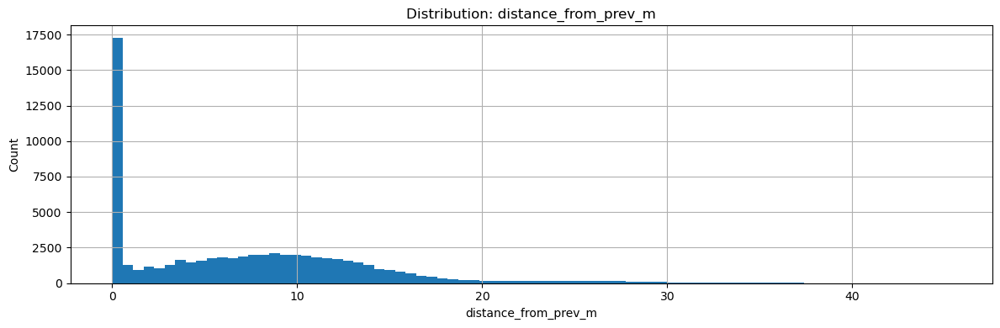

In [27]:
# Convert coordinates to numeric and calculate distance between consecutive samples within each id.
if {LAT_COL, LON_COL}.issubset(drive_clean_base.columns):
    drive_clean_base[LAT_COL] = pd.to_numeric(drive_clean_base[LAT_COL], errors="coerce")
    drive_clean_base[LON_COL] = pd.to_numeric(drive_clean_base[LON_COL], errors="coerce")

    drive_clean_base["prev_lat"] = drive_clean_base.groupby("id")[LAT_COL].shift(1)
    drive_clean_base["prev_lon"] = drive_clean_base.groupby("id")[LON_COL].shift(1)
    drive_clean_base["distance_from_prev_m"] = haversine_km(
        drive_clean_base["prev_lat"], drive_clean_base["prev_lon"],
        drive_clean_base[LAT_COL], drive_clean_base[LON_COL],
    ) * 1000
    # Ignore first row per session and impossible jumps for route statistics.
    drive_clean_base.loc[drive_clean_base["sample_gap_seconds"].isna(), "distance_from_prev_m"] = np.nan

    distance_summary = drive_clean_base["distance_from_prev_m"].describe(percentiles=[0.01, 0.05, 0.5, 0.95, 0.99]).to_frame("distance_from_prev_m")
    display(distance_summary)
    save_table(distance_summary.reset_index().rename(columns={"index": "stat"}), "distance_between_samples_summary.csv")

    plot_numeric_hist(drive_clean_base, "distance_from_prev_m", bins=80)
else:
    print("Latitude/longitude columns are not available.")

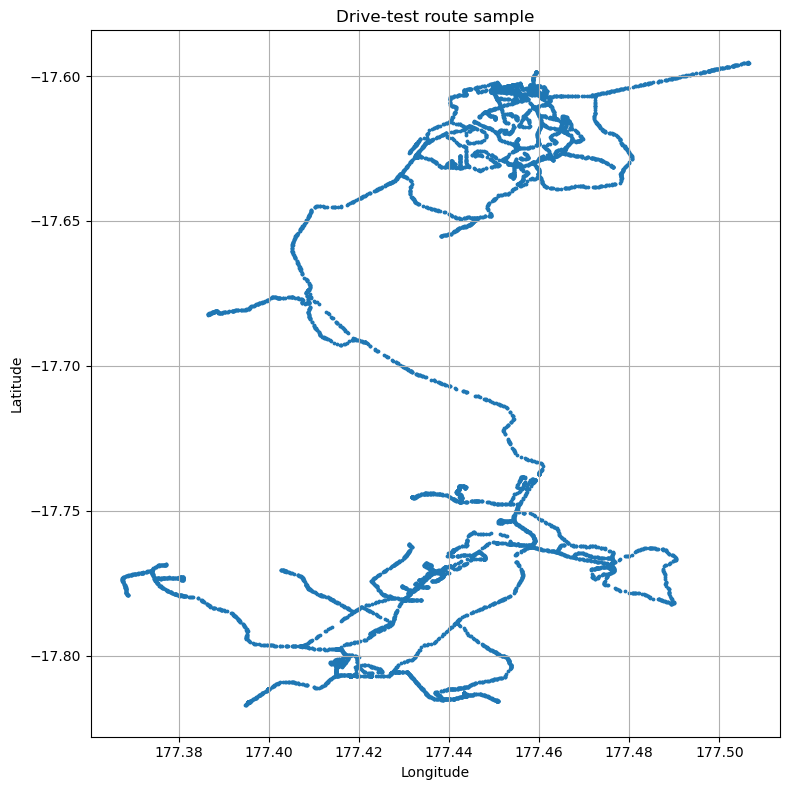

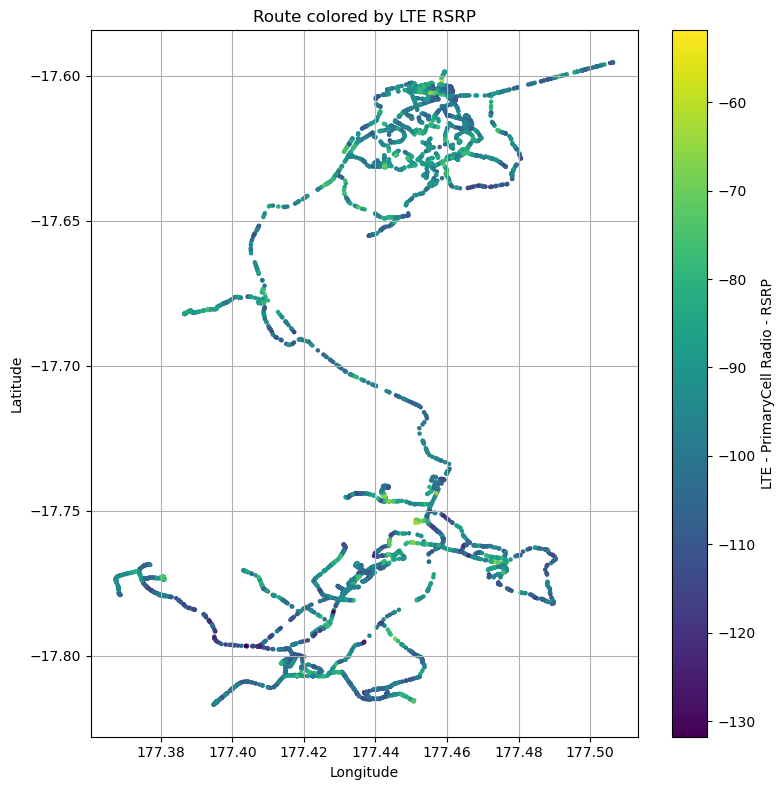

In [28]:
# Route scatter plot.
if {LAT_COL, LON_COL}.issubset(drive_clean_base.columns):
    route_sample = sample_df(drive_clean_base.dropna(subset=[LAT_COL, LON_COL]), MAP_SAMPLE_ROWS)

    plt.figure(figsize=(8, 8))
    plt.scatter(route_sample[LON_COL], route_sample[LAT_COL], s=3)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Drive-test route sample")
    plt.tight_layout()
    plt.show()

    # Colored KPI scatter if LTE RSRP exists.
    if LTE_RSRP_COL:
        kpi_route = route_sample.dropna(subset=[LTE_RSRP_COL])
        plt.figure(figsize=(8, 8))
        sc = plt.scatter(kpi_route[LON_COL], kpi_route[LAT_COL], c=pd.to_numeric(kpi_route[LTE_RSRP_COL], errors="coerce"), s=5)
        plt.colorbar(sc, label=LTE_RSRP_COL)
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.title("Route colored by LTE RSRP")
        plt.tight_layout()
        plt.show()
else:
    print("Route plot skipped because coordinates are missing.")

In [29]:
# Optional interactive folium map.
# Install folium if needed: pip install folium

def create_route_map(df: pd.DataFrame, lat_col: str, lon_col: str, value_col: Optional[str], output_name: str):
    try:
        import folium
        from folium.plugins import MarkerCluster
    except Exception:
        print("folium is not installed. Skipping interactive map.")
        return None

    mdf = sample_df(df.dropna(subset=[lat_col, lon_col]), MAP_SAMPLE_ROWS)
    if mdf.empty:
        print("No valid coordinates for map.")
        return None

    fmap = folium.Map(location=[mdf[lat_col].median(), mdf[lon_col].median()], zoom_start=12, tiles="OpenStreetMap")
    cluster = MarkerCluster().add_to(fmap)

    for _, row in mdf.iterrows():
        popup_items = [f"Time: {row.get('timestamp', '')}"]
        if value_col and value_col in mdf.columns:
            popup_items.append(f"{value_col}: {row.get(value_col, '')}")
        if LTE_PCI_COL and LTE_PCI_COL in mdf.columns:
            popup_items.append(f"LTE PCI: {row.get(LTE_PCI_COL, '')}")
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=2,
            fill=True,
            fill_opacity=0.6,
            popup="<br>".join(popup_items),
        ).add_to(cluster)

    out_path = OUTPUT_DIR / output_name
    fmap.save(out_path)
    print("Saved interactive map:", out_path)
    return fmap

if {LAT_COL, LON_COL}.issubset(drive_clean_base.columns):
    route_map = create_route_map(drive_clean_base, LAT_COL, LON_COL, LTE_RSRP_COL, "drive_route_lte_rsrp_map.html")
    display(route_map) if route_map is not None else None

Saved interactive map: Cleaned_EDA_Outputs\drive_route_lte_rsrp_map.html


# 15. Planning file cleaning and checks

Now we load the NR5G planning file.

Important note: the drive-test data may not contain usable NR measurements. If NR5G drive-test fields are empty, direct NR PCI/RSI validation is not possible yet. However, geographic validation is still useful:

- nearest planned NR site/sector;
- distance to planned sector;
- planned azimuth alignment;
- inside/outside planned cell radius.

In [30]:
# Load planning workbook.
if not PLANNING_XLSX.exists():
    raise FileNotFoundError(f"Planning workbook not found: {PLANNING_XLSX}")

planning_sheets = pd.read_excel(PLANNING_XLSX, sheet_name=None)
print("Planning sheets:", list(planning_sheets.keys()))

planning_df = planning_sheets.get("Planning")
if planning_df is None:
    raise ValueError("Sheet named 'Planning' was not found in the planning workbook.")

planning_df = planning_df.dropna(how="all").dropna(axis=1, how="all").copy()
overview(planning_df, "Planning sheet")

planning_profile = build_data_dictionary(planning_df, name="planning", sample_rows=len(planning_df))
display(planning_profile)
save_table(planning_profile, "planning_data_dictionary.csv")

if "Stats" in planning_sheets:
    planning_stats = planning_sheets["Stats"].dropna(how="all").dropna(axis=1, how="all")
    display(planning_stats)
    save_table(planning_stats, "planning_stats_sheet.csv")

Planning sheets: ['Planning', 'Stats']
===== Planning sheet =====
Shape: (2554, 14)
Rows: 2,554
Columns: 14
Memory: 676.06 KB


,column,dtype,non_null,missing,missing_pct
0,site_sector_ID,object,2554,0,0.000
1,siteID,object,2554,0,0.000
2,sectors_count,int64,2554,0,0.000
3,sectorID,int64,2554,0,0.000
4,Requires_Planning,bool,2554,0,0.000
5,Azimuth,int64,2554,0,0.000
6,Latitude,float64,2554,0,0.000
7,Longitude,float64,2554,0,0.000
8,Freq Band,object,2554,0,0.000
9,Cell Radius,int64,2554,0,0.000


,dataset,column,family,dtype,full_non_null_count,full_missing_count,full_missing_pct,sample_unique_count,sample_unique_pct,sample_non_null_examples,sample_min,sample_max,sample_mean,sample_std,sample_top_values
0,planning,Unnamed: 15,Unnamed:,object,1,2553,99.961,1,100.000,[P],None,None,NaN,NaN,{'P': 1}
1,planning,Mod4,Mod4,float64,2449,105,4.111,4,0.163,"[3.0, 2.0, 0.0, 1.0, 3.0]",0.0,3.0,1.499796,1.123183,None
2,planning,PCI,PCI,float64,2449,105,4.111,1002,40.915,"[439.0, 294.0, 484.0, 577.0, 367.0]",0.0,1007.0,519.742344,294.610900,None
3,planning,RSI,RSI,float64,2449,105,4.111,219,8.942,"[410.0, 310.0, 465.0, 480.0, 175.0]",0.0,830.0,312.809718,247.563199,None
4,planning,Azimuth,Azimuth,int64,2554,0,0.000,72,2.819,"[45, 165, 235, 90, 165]",0,355,169.755286,105.893364,None
5,planning,Cell Radius,Cell,int64,2554,0,0.000,1,0.039,"[7000, 7000, 7000, 7000, 7000]",7000,7000,7000.000000,0.000000,None
6,planning,Freq Band,Freq,object,2554,0,0.000,1,0.039,"[N41, N41, N41, N41, N41]",None,None,NaN,NaN,{'N41': 2554}
7,planning,Latitude,Latitude,float64,2554,0,0.000,723,28.309,"[31.235092, 31.235092, 31.235092, 31.35701, 31.35701]",23.995,31.35701,29.454667,1.845878,None
8,planning,Longitude,Longitude,float64,2554,0,0.000,725,28.387,"[29.956882, 29.956882, 29.956882, 27.22446, 27.22446]",27.22446,34.5169,31.031592,2.088272,None
9,planning,Requires_Planning,Requires_Planning,bool,2554,0,0.000,2,0.078,"[True, True, True, True, True]",False,True,0.041112,0.198588,None


Saved: Cleaned_EDA_Outputs\planning_data_dictionary.csv


,CLASH,Clash_Description,BEFORE,AFTER
0,Total Clashes,,819.0,815.0
2,(PCI Collision),Adjacent 1st Neigh PCI clash,0.0,0.0
3,(PCI Confusion),2nd Neigh PCI clash,1.0,1.0
4,,,NaN,NaN
5,(Mod4 Inter-site),Adjacent 1st Neigh mod4 clash,794.0,790.0
6,(Mod4 Intra-site),Adjacent 1st Neigh co-site mod4 clash,24.0,24.0
7,(Mod4 non-adj Intra-site ),Non-Adjacent 1st Neigh co-site mod4 clash,11.0,11.0


Saved: Cleaned_EDA_Outputs\planning_stats_sheet.csv


In [31]:
# Planning expected columns.
PLAN_SITE_SECTOR_COL = first_existing(planning_df, ["site_sector_ID"])
PLAN_SITE_COL = first_existing(planning_df, ["siteID"])
PLAN_SECTOR_COL = first_existing(planning_df, ["sectorID"])
PLAN_REQUIRES_COL = first_existing(planning_df, ["Requires_Planning"])
PLAN_AZIMUTH_COL = first_existing(planning_df, ["Azimuth"])
PLAN_LAT_COL = first_existing(planning_df, ["Latitude"])
PLAN_LON_COL = first_existing(planning_df, ["Longitude"])
PLAN_BAND_COL = first_existing(planning_df, ["Freq Band"])
PLAN_RADIUS_COL = first_existing(planning_df, ["Cell Radius"])
PLAN_RSI_COL = first_existing(planning_df, ["RSI"])
PLAN_PCI_COL = first_existing(planning_df, ["PCI"])
PLAN_MOD4_COL = first_existing(planning_df, ["Mod4"])

planning_key_cols = [c for c in [PLAN_SITE_SECTOR_COL, PLAN_SITE_COL, PLAN_SECTOR_COL, PLAN_REQUIRES_COL, PLAN_AZIMUTH_COL, PLAN_LAT_COL, PLAN_LON_COL, PLAN_BAND_COL, PLAN_RADIUS_COL, PLAN_RSI_COL, PLAN_PCI_COL, PLAN_MOD4_COL] if c]
print("Planning key columns:")
display(pd.DataFrame({"column": planning_key_cols}))

display(planning_df[planning_key_cols].head(20))

Planning key columns:


,column
0,site_sector_ID
1,siteID
2,sectorID
3,Requires_Planning
4,Azimuth
5,Latitude
6,Longitude
7,Freq Band
8,Cell Radius
9,RSI


,site_sector_ID,siteID,sectorID,Requires_Planning,Azimuth,Latitude,Longitude,Freq Band,Cell Radius,RSI,PCI,Mod4
0,ALX3282-1,ALX3282,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN
1,ALX3282-2,ALX3282,92,True,165,31.235092,29.956882,N41,7000,NaN,NaN,NaN
2,ALX3282-3,ALX3282,93,True,235,31.235092,29.956882,N41,7000,NaN,NaN,NaN
3,ALX3744-1,ALX3744,91,True,90,31.357010,27.224460,N41,7000,NaN,NaN,NaN
4,ALX3744-2,ALX3744,92,True,165,31.357010,27.224460,N41,7000,NaN,NaN,NaN
5,ALX3744-3,ALX3744,93,True,245,31.357010,27.224460,N41,7000,NaN,NaN,NaN
6,ALX3744-4,ALX3744,94,True,330,31.357010,27.224460,N41,7000,NaN,NaN,NaN
7,ALX6116-1,ALX6116,91,True,15,31.356861,27.264692,N41,7000,NaN,NaN,NaN
8,ALX6116-2,ALX6116,92,True,80,31.356861,27.264692,N41,7000,NaN,NaN,NaN
9,ALX6116-3,ALX6116,93,True,200,31.356861,27.264692,N41,7000,NaN,NaN,NaN


In [32]:
# Mod4 consistency: Mod4 should equal PCI % 4 when both are present.
if PLAN_PCI_COL and PLAN_MOD4_COL:
    planning_mod4 = planning_df.copy()
    planning_mod4["PCI_numeric"] = pd.to_numeric(planning_mod4[PLAN_PCI_COL], errors="coerce")
    planning_mod4["Mod4_numeric"] = pd.to_numeric(planning_mod4[PLAN_MOD4_COL], errors="coerce")
    planning_mod4["Expected_Mod4"] = planning_mod4["PCI_numeric"] % 4
    planning_mod4["Mod4_Matches"] = planning_mod4["Expected_Mod4"] == planning_mod4["Mod4_numeric"]
    planning_mod4_valid = planning_mod4.dropna(subset=["PCI_numeric", "Mod4_numeric"])

    print("Valid Mod4 rows:", len(planning_mod4_valid))
    print("Mod4 mismatches:", int((~planning_mod4_valid["Mod4_Matches"]).sum()))
    display(planning_mod4_valid[[c for c in planning_key_cols + ["Expected_Mod4", "Mod4_Matches"] if c in planning_mod4_valid.columns]].head(30))
    save_table(planning_mod4_valid, "planning_mod4_check.csv")
else:
    print("Planning PCI or Mod4 column missing.")

Valid Mod4 rows: 2449
Mod4 mismatches: 0


,site_sector_ID,siteID,sectorID,Requires_Planning,Azimuth,Latitude,Longitude,Freq Band,Cell Radius,RSI,PCI,Mod4,Expected_Mod4,Mod4_Matches
105,ALX2014-1,ALX2014,91,False,0,30.857845,28.883688,N41,7000,410.0,439.0,3.0,3.0,True
106,ALX2014-2,ALX2014,92,False,60,30.857845,28.883688,N41,7000,310.0,294.0,2.0,2.0,True
107,ALX2014-3,ALX2014,93,False,135,30.857845,28.883688,N41,7000,465.0,484.0,0.0,0.0,True
108,ALX2014-4,ALX2014,94,False,320,30.857845,28.883688,N41,7000,480.0,577.0,1.0,1.0,True
109,ALX3005-1,ALX3005,91,False,60,31.208300,29.963000,N41,7000,175.0,367.0,3.0,3.0,True
110,ALX3005-2,ALX3005,92,False,205,31.208300,29.963000,N41,7000,170.0,982.0,2.0,2.0,True
111,ALX3005-3,ALX3005,93,False,300,31.208300,29.963000,N41,7000,165.0,560.0,0.0,0.0,True
112,ALX3011-1,ALX3011,91,False,30,31.260000,29.985900,N41,7000,155.0,153.0,1.0,1.0,True
113,ALX3011-2,ALX3011,92,False,125,31.260000,29.985900,N41,7000,115.0,167.0,3.0,3.0,True
114,ALX3011-3,ALX3011,93,False,250,31.260000,29.985900,N41,7000,110.0,880.0,0.0,0.0,True


Saved: Cleaned_EDA_Outputs\planning_mod4_check.csv


# 16. Drive-test vs planning comparison

The direct comparison depends on whether the drive-test contains NR PCI/RSI. If not, this section still performs geographic comparison using the nearest planned site/sector.

In [33]:
# Quick direct value-set comparison function.
def compare_observed_vs_planned(observed_df: pd.DataFrame, observed_col: str, planned_df: pd.DataFrame, planned_col: str, label: str) -> Dict[str, pd.DataFrame]:
    observed = set(pd.to_numeric(observed_df[observed_col], errors="coerce").dropna().astype(int).unique())
    planned = set(pd.to_numeric(planned_df[planned_col], errors="coerce").dropna().astype(int).unique())

    result = {
        "observed_not_planned": pd.DataFrame({label: sorted(observed - planned)}),
        "planned_not_observed": pd.DataFrame({label: sorted(planned - observed)}),
        "common": pd.DataFrame({label: sorted(observed & planned)}),
    }
    print(f"{label}: observed={len(observed)}, planned={len(planned)}, common={len(observed & planned)}, observed_not_planned={len(observed - planned)}")
    return result

# NR direct comparison if NR values exist after cleaning.
if NR5G_PCI_COL and PLAN_PCI_COL and drive_clean_base[NR5G_PCI_COL].notna().any():
    nr_pci_cmp = compare_observed_vs_planned(drive_clean_base, NR5G_PCI_COL, planning_df, PLAN_PCI_COL, "PCI")
    save_table(nr_pci_cmp["observed_not_planned"], "nr_observed_pci_not_in_planning.csv")
    save_table(nr_pci_cmp["planned_not_observed"], "planning_pci_not_observed_in_nr_drive.csv")
else:
    print("NR PCI direct comparison skipped because usable NR PCI was not found in the cleaned drive-test data.")

if PLAN_RSI_COL:
    print("RSI planning exists, but direct drive-test RSI comparison requires a usable drive-test RSI/root-sequence column.")

NR PCI direct comparison skipped because usable NR PCI was not found in the cleaned drive-test data.
RSI planning exists, but direct drive-test RSI comparison requires a usable drive-test RSI/root-sequence column.


Nearest planning sample shape: (20000, 230)


,id,timestamp,Location - Latitude,Location - Longitude,LTE - Serving - PCI,LTE - PrimaryCell Radio - RSRP,LTE - PrimaryCell Radio - PCell_SINR,nearest_plan_distance_km,azimuth_error_deg,inside_planned_radius,plan_site_sector_ID,plan_siteID,plan_sectorID,plan_Requires_Planning,plan_Azimuth,plan_Latitude,plan_Longitude,plan_Freq Band,plan_Cell Radius,plan_RSI,plan_PCI,plan_Mod4
0,542020041221088+20250825155527+Fiji-Nadi-MO-D!20250825142302,2025-08-25 04:22:39+02:00,-17.801255,177.415638,NaN,NaN,NaN,16057.939606,170.726756,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
1,542020041221088+20250828143859+Fiji-Nadi-LTE-DL-D!20250828143815,2025-08-28 04:38:12+02:00,-17.626425,177.433059,346.0,-88.818690,8.586021,16051.561814,170.441732,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
2,542020041221088+20250825122951+Fiji-Nadi-MO-D!20250825122134,2025-08-25 02:19:50+02:00,-17.809420,177.405922,NaN,NaN,NaN,16057.377160,170.746093,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
3,542020041221088+20250828124303+Fiji-Nadi-LTE-DL-D!20250828124223,2025-08-28 02:41:03+02:00,-17.619619,177.439291,406.0,-91.844734,10.205554,16051.847211,170.426869,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
4,542020041221088+20250825134223+Fiji-Nadi-MO-D!20250825124219,2025-08-25 02:42:02+02:00,-17.763627,177.456436,NaN,NaN,NaN,16060.145011,170.640274,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
5,542020041221088+20250827133446+Fiji-Nadi-LTE-DL-D!20250827125432,2025-08-27 02:53:56+02:00,-17.803482,177.414822,144.0,-84.172554,23.781607,16057.963075,170.730793,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
6,542020041221088+20250829102513+Nawaka-LTE-DL!20250829102435,2025-08-29 00:24:25+02:00,-17.812891,177.443264,469.0,-105.053215,4.536458,16061.137531,170.726322,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
7,542020041221088+20250827123738+Fiji-Nadi-LTE-DL-D!20250827115101,2025-08-27 01:49:20+02:00,-17.773546,177.374553,158.0,-88.655890,23.525303,16052.705517,170.711152,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
8,542020041221088+20250827122034+Fiji-Nadi-LTE-DL-D!20250827113125,2025-08-27 01:30:23+02:00,-17.773339,177.423233,394.0,-96.407670,13.821688,16057.390169,170.677939,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0
9,542020041221088+20250827133827+Fiji-Nadi-LTE-DL-D!20250827130111,2025-08-27 02:59:36+02:00,-17.795848,177.417901,362.0,-94.664650,10.370454,16057.909667,170.716766,False,SIN6252-3,SIN6252,93,False,270,28.506864,34.516744,N41,7000,395.0,642.0,2.0


Saved: Cleaned_EDA_Outputs\drive_nearest_planning_sample.csv


,nearest_plan_distance_km
count,20000.000000
mean,16056.108367
std,3.394406
min,16049.647282
1%,16050.267476
5%,16051.530383
50%,16056.222976
95%,16061.571227
99%,16063.209242
max,16064.213659


Saved: Cleaned_EDA_Outputs\nearest_planning_distance_summary.csv


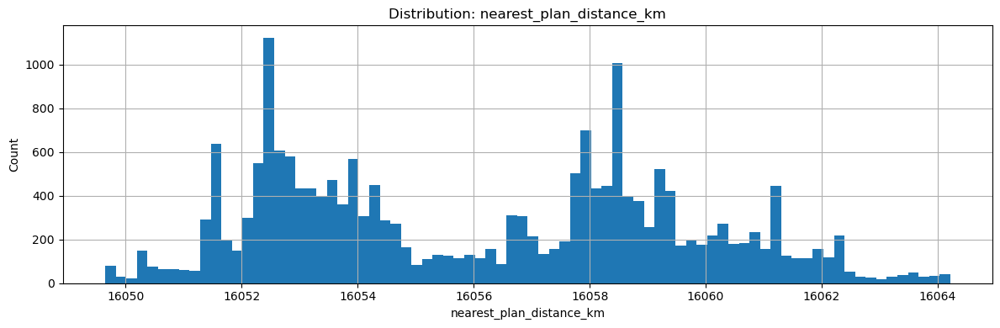

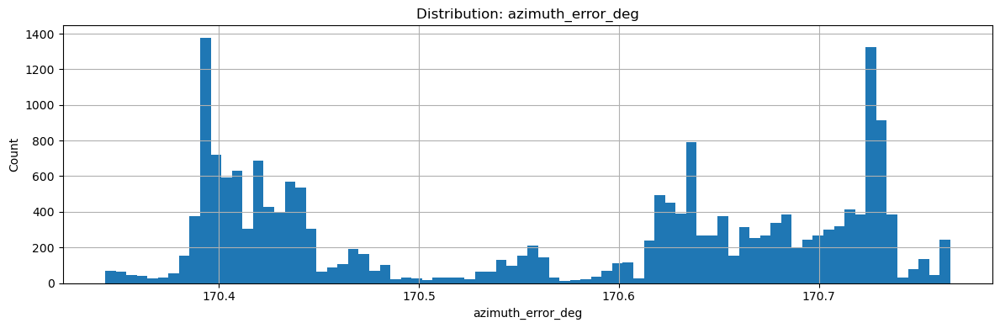

In [34]:
# Nearest planned sector/site for sampled drive-test points.
def nearest_planning_match(drive_points: pd.DataFrame, planning: pd.DataFrame) -> pd.DataFrame:
    required = [LAT_COL, LON_COL]
    plan_required = [PLAN_LAT_COL, PLAN_LON_COL]
    if not all(c in drive_points.columns for c in required) or not all(c in planning.columns for c in plan_required):
        print("Coordinate columns are missing for nearest planning match.")
        return pd.DataFrame()

    left = drive_points.dropna(subset=[LAT_COL, LON_COL]).copy()
    right = planning.dropna(subset=[PLAN_LAT_COL, PLAN_LON_COL]).copy()

    if left.empty or right.empty:
        print("No valid coordinate rows for nearest planning match.")
        return pd.DataFrame()

    left = sample_df(left, NEAREST_PLANNING_SAMPLE_ROWS)

    try:
        from sklearn.neighbors import BallTree
        left_rad = np.radians(left[[LAT_COL, LON_COL]].astype(float).values)
        right_rad = np.radians(right[[PLAN_LAT_COL, PLAN_LON_COL]].astype(float).values)
        tree = BallTree(right_rad, metric="haversine")
        dist_rad, idx = tree.query(left_rad, k=1)
        nearest_idx = idx[:, 0]
        dist_km = dist_rad[:, 0] * EARTH_RADIUS_KM
    except Exception as e:
        print("BallTree unavailable; using slower fallback. Reason:", e)
        nearest_idx = []
        dist_km = []
        right_lat = right[PLAN_LAT_COL].astype(float).values
        right_lon = right[PLAN_LON_COL].astype(float).values
        for _, row in left.iterrows():
            d = haversine_km(float(row[LAT_COL]), float(row[LON_COL]), right_lat, right_lon)
            j = int(np.argmin(d))
            nearest_idx.append(j)
            dist_km.append(float(d[j]))
        nearest_idx = np.array(nearest_idx)
        dist_km = np.array(dist_km)

    nearest = right.iloc[nearest_idx].reset_index(drop=True).add_prefix("plan_")
    result = pd.concat([left.reset_index(drop=True), nearest], axis=1)
    result["nearest_plan_distance_km"] = dist_km

    # Add azimuth alignment if available.
    if PLAN_AZIMUTH_COL:
        plan_az = "plan_" + PLAN_AZIMUTH_COL
        plan_lat = "plan_" + PLAN_LAT_COL
        plan_lon = "plan_" + PLAN_LON_COL
        if all(c in result.columns for c in [plan_az, plan_lat, plan_lon]):
            result["bearing_from_plan_to_drive"] = bearing_degrees(
                result[plan_lat].astype(float), result[plan_lon].astype(float),
                result[LAT_COL].astype(float), result[LON_COL].astype(float),
            )
            result["azimuth_error_deg"] = angular_difference_deg(pd.to_numeric(result[plan_az], errors="coerce"), result["bearing_from_plan_to_drive"])

    if PLAN_RADIUS_COL:
        plan_radius = "plan_" + PLAN_RADIUS_COL
        if plan_radius in result.columns:
            # Planning radius appears to be in meters in your planning file.
            result["inside_planned_radius"] = result["nearest_plan_distance_km"] <= (pd.to_numeric(result[plan_radius], errors="coerce") / 1000.0)

    return result

nearest_plan = nearest_planning_match(drive_clean_base, planning_df)
print("Nearest planning sample shape:", nearest_plan.shape)

if not nearest_plan.empty:
    selected_plan_cols = [
        "id", "timestamp", LAT_COL, LON_COL,
        LTE_PCI_COL, LTE_RSRP_COL, LTE_SINR_COL,
        "nearest_plan_distance_km", "azimuth_error_deg", "inside_planned_radius",
    ]
    selected_plan_cols += ["plan_" + c for c in planning_key_cols]
    selected_plan_cols = [c for c in selected_plan_cols if c and c in nearest_plan.columns]
    display(nearest_plan[selected_plan_cols].head(30))
    save_table(nearest_plan[selected_plan_cols], "drive_nearest_planning_sample.csv")

    # Useful summary tables.
    nearest_summary = nearest_plan["nearest_plan_distance_km"].describe(percentiles=[0.01, 0.05, 0.5, 0.95, 0.99]).to_frame("nearest_plan_distance_km")
    display(nearest_summary)
    save_table(nearest_summary.reset_index().rename(columns={"index": "stat"}), "nearest_planning_distance_summary.csv")

    plot_numeric_hist(nearest_plan, "nearest_plan_distance_km", bins=80)
    if "azimuth_error_deg" in nearest_plan.columns:
        plot_numeric_hist(nearest_plan, "azimuth_error_deg", bins=80)
else:
    print("Nearest planning comparison was not created.")

# 17. Export cleaned dataset

The clean base dataset keeps useful EDA columns and derived features, while preserving missing KPI values.

Parquet is recommended because it keeps datatypes better and is usually smaller. If Parquet support is not installed, the notebook exports a compressed CSV instead.

In [35]:
if EXPORT_CLEANED_FULL_DATA:
    parquet_path = OUTPUT_DIR / "drive_clean_base.parquet"
    csv_gz_path = OUTPUT_DIR / "drive_clean_base.csv.gz"

    try:
        drive_clean_base.to_parquet(parquet_path, index=False)
        print("Saved cleaned dataset as Parquet:", parquet_path)
    except Exception as e:
        print("Parquet export failed, likely because pyarrow/fastparquet is not installed.")
        print("Reason:", e)
        drive_clean_base.to_csv(csv_gz_path, index=False, compression="gzip", encoding="utf-8-sig")
        print("Saved cleaned dataset as compressed CSV:", csv_gz_path)

# Always save a small sample for quick review in Excel.
clean_sample = sample_df(drive_clean_base, min(5000, len(drive_clean_base)))
save_table(clean_sample, "drive_clean_base_sample_5000.csv")

Saved cleaned dataset as Parquet: Cleaned_EDA_Outputs\drive_clean_base.parquet
Saved: Cleaned_EDA_Outputs\drive_clean_base_sample_5000.csv


WindowsPath('Cleaned_EDA_Outputs/drive_clean_base_sample_5000.csv')

# 18. Final generated-output index

This cell lists everything exported to `Cleaned_EDA_Outputs` so you can quickly review the outputs and decide what to improve next.

In [36]:
output_index = []
for path in sorted(OUTPUT_DIR.glob("*")):
    if path.is_file():
        output_index.append({
            "file": path.name,
            "size": human_bytes(path.stat().st_size),
            "path": str(path),
        })

output_index_df = pd.DataFrame(output_index)
display(output_index_df)
save_table(output_index_df, "output_index.csv")

,file,size,path
0,activity_table.csv,138.53 KB,Cleaned_EDA_Outputs\activity_table.csv
1,activity_type_summary.csv,56.00 B,Cleaned_EDA_Outputs\activity_type_summary.csv
2,cleaned_data_dictionary.csv,39.76 KB,Cleaned_EDA_Outputs\cleaned_data_dictionary.csv
3,cleaning_summary.csv,210.00 B,Cleaned_EDA_Outputs\cleaning_summary.csv
4,column_family_summary_after_cleaning.csv,432.00 B,Cleaned_EDA_Outputs\column_family_summary_after_cleaning.csv
5,column_family_summary_before_cleaning.csv,734.00 B,Cleaned_EDA_Outputs\column_family_summary_before_cleaning.csv
6,detected_key_columns.csv,606.00 B,Cleaned_EDA_Outputs\detected_key_columns.csv
7,distance_between_samples_summary.csv,213.00 B,Cleaned_EDA_Outputs\distance_between_samples_summary.csv
8,drive_clean_base.parquet,18.66 MB,Cleaned_EDA_Outputs\drive_clean_base.parquet
9,drive_clean_base_sample_5000.csv,6.92 MB,Cleaned_EDA_Outputs\drive_clean_base_sample_5000.csv


Saved: Cleaned_EDA_Outputs\output_index.csv


WindowsPath('Cleaned_EDA_Outputs/output_index.csv')

# Recommended next decisions after running this notebook

After running the notebook, inspect these outputs first:

1. `removed_columns_report.csv` — confirm no valuable columns were removed.
2. `kept_columns_after_cleaning.csv` — confirm the clean base is not too aggressive.
3. `technology_availability_summary.csv` — confirm whether the file is mostly LTE/WCDMA and whether NR is really empty.
4. `events_long.csv` — inspect the event types and decide which events matter for RCA.
5. `session_summary.csv` — choose sessions/routes to analyze deeply.
6. `drive_nearest_planning_sample.csv` — check whether geographic planning validation makes sense.

Once these are reviewed, the next notebook can become a focused project pipeline, for example:

- LTE/WCDMA coverage anomaly detection;
- event-driven root cause analysis;
- call/CSFB analysis;
- throughput degradation analysis;
- geographic validation against NR planning;
- PCI/mod4 planning validation if usable NR or LTE planning fields are available.